## MOUNT DRIVE

In [ ]:
# ==========================================
# 0. MOUNT GOOGLE DRIVE
# ==========================================
from google.colab import drive
import os

print("Mounting Google Drive...")
drive.mount('/content/drive')

Mounting Google Drive...
Mounted at /content/drive


## ini nyari treshold

[*] Inisialisasi model di device: cuda
Downloading: "https://download.pytorch.org/models/efficientnet_b2_rwightman-c35c1473.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b2_rwightman-c35c1473.pth


100%|██████████| 35.2M/35.2M [00:00<00:00, 190MB/s]


[*] Mempersiapkan dataset...


README.md:   0%|          | 0.00/2.13k [00:00<?, ?B/s]

data/train-00000-of-00001-c08a401c53fe53(…): reconstructing file:   0%|          |  0.00B / 22.6MB            

data/train-00000-of-00001-c08a401c53fe53(…): downloading bytes:           |  0.00B            

data/test-00000-of-00001-44110b9df98c558(…): reconstructing file:   0%|          |  0.00B / 5.65MB            

data/test-00000-of-00001-44110b9df98c558(…): downloading bytes:           |  0.00B            

Generating train split:   0%|          | 0/5120 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/1280 [00:00<?, ? examples/s]

Total data test yang siap dievaluasi: 1280 gambar

[*] Tahap 1: Melakukan inferensi pada seluruh data test...

[*] Tahap 1.5: Menganalisis Distribusi Confidence dan Mencari Threshold...
--> Threshold hasil Otsu: 0.8516
--> Threshold hasil KMeans: 0.8540
[*] MENGGUNAKAN THRESHOLD: 0.8516 untuk pembagian kuadran.
[*] Grafik histogram telah disimpan sebagai 'histogram_confidence_efficientnetb2.png'

[*] Tahap 2: Menganalisis kuadran dan memilih sampel...

=== LOG PENJELASAN SAMPEL ===

--- KELAS: MildDemented ---
Index  452 | BENAR                     | Prob: 0.9997 | Kuadran: High-Conf Correct
Index 1016 | BENAR                     | Prob: 0.7326 | Kuadran: Low-Conf Correct
Index  460 | SALAH (Tebak: VeryMildDemented) | Prob: 0.8950 | Kuadran: High-Conf Incorrect
Index   59 | SALAH (Tebak: NonDemented) | Prob: 0.6474 | Kuadran: Low-Conf Incorrect
Index  694 | BENAR                     | Prob: 0.9998 | Kuadran: High-Conf Correct
Index  604 | BENAR                     | Prob: 0.7817 | Kuad

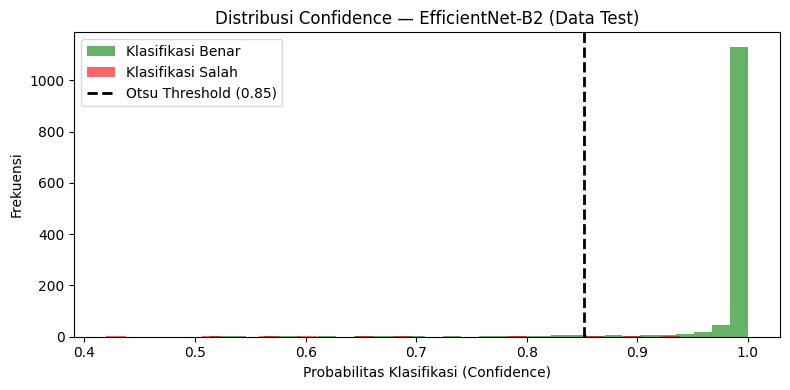

In [ ]:
# ========================================================
# 1. IMPORTS & CONFIGURATION
# ========================================================
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision.models import efficientnet_b2, EfficientNet_B2_Weights
from torchvision import transforms
from datasets import load_dataset
import numpy as np
import random
import matplotlib.pyplot as plt
from skimage.filters import threshold_otsu
from sklearn.cluster import KMeans

# --- Konfigurasi Environment ---
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
SEED = 42

# --- Konfigurasi Model & Data ---
MODEL_PATH = "/content/drive/MyDrive/Alzheimer_EfficientNet_Models_Sampler/model_S16_AdamW_CosineAnnealingLR.pth"
TARGET_NAMES = ["MildDemented", "ModerateDemented", "NonDemented", "VeryMildDemented"]
NUM_CLASSES = len(TARGET_NAMES)
SAMPLES_PER_CLASS = 15

# Set Seeds
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

# ========================================================
# 2. MODEL INITIALIZATION
# ========================================================
print(f"[*] Inisialisasi model di device: {DEVICE}")

# Load EfficientNet-B2 Base
model = efficientnet_b2(weights=EfficientNet_B2_Weights.DEFAULT)
num_ftrs = model.classifier[1].in_features

# Custom Classifier
model.classifier = nn.Sequential(
    nn.Dropout(p=0.3, inplace=False),
    nn.Linear(num_ftrs, 512),
    nn.ReLU(inplace=False),
    nn.Dropout(p=0.5, inplace=False),
    nn.Linear(512, NUM_CLASSES)
)

# Load Weights
model.load_state_dict(torch.load(MODEL_PATH, map_location=DEVICE))

# 🔥 Refactor: Matikan inplace dengan cara Pythonic & efisien (tanpa rekursif)
for module in model.modules():
    if hasattr(module, 'inplace'):
        module.inplace = False

model = model.to(DEVICE)
model.eval()

# ========================================================
# 3. DATA PREPARATION
# ========================================================
print("[*] Mempersiapkan dataset...")
dataset = load_dataset("Falah/Alzheimer_MRI")
test_data = dataset["test"]

class AlzheimerDataset(Dataset):
    def __init__(self, hf_data, transform=None):
        self.data = hf_data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image = item["image"].convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, item["label"]

transform = transforms.Compose([
    transforms.Resize((260, 260)), # EfficientNet-B2 menggunakan resolusi 260x260
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

dataset_obj = AlzheimerDataset(test_data, transform)

def unnormalize(img_tensor):
    mean, std = np.array([0.485, 0.456, 0.406]), np.array([0.229, 0.224, 0.225])
    img = img_tensor.permute(1, 2, 0).detach().cpu().numpy()
    img = std * img + mean
    return np.clip(img, 0, 1)

print(f"Total data test yang siap dievaluasi: {len(dataset_obj)} gambar")

# ========================================================
# 4. TAHAP 1: INFERENSI PADA SELURUH DATA UJI
# ========================================================
print("\n[*] Tahap 1: Melakukan inferensi pada seluruh data test...")
test_loader = DataLoader(dataset_obj, batch_size=32, shuffle=False)
all_preds, all_labels, all_probs, all_indices = [], [], [], []

with torch.no_grad():
    for i, (imgs, labels) in enumerate(test_loader):
        imgs, labels = imgs.to(DEVICE), labels.to(DEVICE)
        outputs = model(imgs)
        probs = F.softmax(outputs, dim=1)
        max_probs, preds = torch.max(probs, 1)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
        all_probs.extend(max_probs.cpu().numpy())

        start_idx = i * 32
        all_indices.extend(list(range(start_idx, start_idx + len(labels))))

all_preds = np.array(all_preds)
all_labels = np.array(all_labels)
all_probs = np.array(all_probs)
all_indices = np.array(all_indices)

# ========================================================
# 5. TAHAP 1.5: PENCARIAN THRESHOLD DINAMIS & VISUALISASI
# ========================================================
print("\n[*] Tahap 1.5: Menganalisis Distribusi Confidence dan Mencari Threshold...")

# Pisahkan probabilitas yang benar dan salah
correct_mask = (all_preds == all_labels)
probs_correct = all_probs[correct_mask]
probs_incorrect = all_probs[~correct_mask]

# Hitung threshold via Otsu
threshold_otsu_val = threshold_otsu(all_probs)
print(f"--> Threshold hasil Otsu: {threshold_otsu_val:.4f}")

# Hitung threshold via KMeans (Untuk perbandingan)
probs_reshaped = all_probs.reshape(-1, 1)
kmeans = KMeans(n_clusters=2, random_state=SEED, n_init=10).fit(probs_reshaped)
centers = sorted(kmeans.cluster_centers_.flatten())
threshold_kmeans = (centers[0] + centers[1]) / 2
print(f"--> Threshold hasil KMeans: {threshold_kmeans:.4f}")

# Tetapkan threshold yang akan digunakan
CONFIDENCE_THRESHOLD = threshold_otsu_val
print(f"[*] MENGGUNAKAN THRESHOLD: {CONFIDENCE_THRESHOLD:.4f} untuk pembagian kuadran.")

# Visualisasi Histogram
plt.figure(figsize=(8, 4))
plt.hist(probs_correct, bins=30, alpha=0.6, label="Klasifikasi Benar", color="green")
plt.hist(probs_incorrect, bins=30, alpha=0.6, label="Klasifikasi Salah", color="red")
plt.axvline(CONFIDENCE_THRESHOLD, color="black", linestyle="--", linewidth=2, label=f"Otsu Threshold ({CONFIDENCE_THRESHOLD:.2f})")
plt.xlabel("Probabilitas Klasifikasi (Confidence)")
plt.ylabel("Frekuensi")
plt.title(f"Distribusi Confidence — EfficientNet-B2 (Data Test)")
plt.legend()
plt.tight_layout()
plt.savefig("histogram_confidence_efficientnetb2.png", dpi=300)
print("[*] Grafik histogram telah disimpan sebagai 'histogram_confidence_efficientnetb2.png'\n")

# ========================================================
# 6. TAHAP 2: PROSES SAMPLING 4 KUADRAN
# ========================================================
fixed_indices_dict = {name: [] for name in TARGET_NAMES}
explanation_log = []

print("[*] Tahap 2: Menganalisis kuadran dan memilih sampel...")
for c_idx, c_name in enumerate(TARGET_NAMES):
    class_mask = (all_labels == c_idx)
    class_indices = all_indices[class_mask]

    explanation_log.append(f"\n--- KELAS: {c_name} ---")

    # Ambil semua jika data minoritas (Misal Kelas ModerateDemented)
    if len(class_indices) <= SAMPLES_PER_CLASS:
        for idx in class_indices:
            pred_stat = "BENAR" if all_preds[idx] == all_labels[idx] else f"SALAH (Tebak: {TARGET_NAMES[all_preds[idx]]})"
            explanation_log.append(f"Index {idx:4d} | {pred_stat:25} | Prob: {all_probs[idx]:.4f} | (Otomatis diambil semua)")
            fixed_indices_dict[c_name].append(int(idx))
        continue

    # Pembagian 4 Kuadran menggunakan dinamis threshold
    c_correct_mask = (all_preds[class_indices] == all_labels[class_indices])
    c_incorrect_mask = ~c_correct_mask
    c_high_conf = (all_probs[class_indices] > CONFIDENCE_THRESHOLD)
    c_low_conf = ~c_high_conf

    # Assign ke masing-masing kuadran dan acak
    quadrants = [
        (list(class_indices[c_correct_mask & c_high_conf]), "High-Conf Correct"),
        (list(class_indices[c_correct_mask & c_low_conf]), "Low-Conf Correct"),
        (list(class_indices[c_incorrect_mask & c_high_conf]), "High-Conf Incorrect"),
        (list(class_indices[c_incorrect_mask & c_low_conf]), "Low-Conf Incorrect")
    ]
    for q_list, _ in quadrants:
        random.shuffle(q_list)

    # Round-robin sampling
    selected = []
    while len(selected) < SAMPLES_PER_CLASS and any(len(q[0]) > 0 for q in quadrants):
        for q_list, q_name in quadrants:
            if len(selected) >= SAMPLES_PER_CLASS: break
            if len(q_list) > 0:
                idx = q_list.pop(0)
                selected.append((idx, q_name))
                fixed_indices_dict[c_name].append(int(idx))

    # Logging hasil sampel kelas ini
    for idx, q_name in selected:
        pred_stat = "BENAR" if all_preds[idx] == all_labels[idx] else f"SALAH (Tebak: {TARGET_NAMES[all_preds[idx]]})"
        explanation_log.append(f"Index {idx:4d} | {pred_stat:25} | Prob: {all_probs[idx]:.4f} | Kuadran: {q_name}")

# ========================================================
# 7. OUTPUT & LOGGING
# ========================================================
print("\n=== LOG PENJELASAN SAMPEL ===")
for line in explanation_log:
    print(line)

print("\n\n=== ⬇️ COPY DICTIONARY INI KE PIPELINE VISUALISASI ⬇️ ===")
print("fixed_indices_dict = {")
for i, (cls, indices) in enumerate(fixed_indices_dict.items()):
    comma = "," if i < len(fixed_indices_dict) - 1 else ""
    print(f'    "{cls}": {indices}{comma}')
print("}")

# SAMPLING DATA TEST

sampling (15 sampel)

In [ ]:
# ========================================================
# 1. IMPORTS & CONFIGURATION
# ========================================================
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision.models import efficientnet_b2, EfficientNet_B2_Weights
from torchvision import transforms
from datasets import load_dataset
import numpy as np
import random

# --- Konfigurasi Environment ---
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
SEED = 42

# --- Konfigurasi Model & Data ---
MODEL_PATH = "/content/drive/MyDrive/Alzheimer_EfficientNet_Models_Sampler/model_S16_AdamW_CosineAnnealingLR.pth"
TARGET_NAMES = ["MildDemented", "ModerateDemented", "NonDemented", "VeryMildDemented"]
NUM_CLASSES = len(TARGET_NAMES)
SAMPLES_PER_CLASS = 15
CONFIDENCE_THRESHOLD = 0.8

# Set Seeds
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

# ========================================================
# 2. MODEL INITIALIZATION
# ========================================================
print(f"[*] Inisialisasi model di device: {DEVICE}")

# Load EfficientNet-B2 Base
model = efficientnet_b2(weights=EfficientNet_B2_Weights.DEFAULT)
num_ftrs = model.classifier[1].in_features

# Custom Classifier
model.classifier = nn.Sequential(
    nn.Dropout(p=0.3, inplace=False),
    nn.Linear(num_ftrs, 512),
    nn.ReLU(inplace=False),
    nn.Dropout(p=0.5, inplace=False),
    nn.Linear(512, NUM_CLASSES)
)

# Load Weights
model.load_state_dict(torch.load(MODEL_PATH, map_location=DEVICE))

# 🔥 Refactor: Matikan inplace dengan cara Pythonic & efisien (tanpa rekursif)
for module in model.modules():
    if hasattr(module, 'inplace'):
        module.inplace = False

model = model.to(DEVICE)
model.eval()

# ========================================================
# 3. DATA PREPARATION
# ========================================================
print("[*] Mempersiapkan dataset...")
dataset = load_dataset("Falah/Alzheimer_MRI")
test_data = dataset["test"]

class AlzheimerDataset(Dataset):
    def __init__(self, hf_data, transform=None):
        self.data = hf_data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image = item["image"].convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, item["label"]

transform = transforms.Compose([
    transforms.Resize((260, 260)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

dataset_obj = AlzheimerDataset(test_data, transform)

def unnormalize(img_tensor):
    mean, std = np.array([0.485, 0.456, 0.406]), np.array([0.229, 0.224, 0.225])
    img = img_tensor.permute(1, 2, 0).detach().cpu().numpy()
    img = std * img + mean
    return np.clip(img, 0, 1)

print(f"Total data test yang siap dievaluasi: {len(dataset_obj)} gambar")

# ========================================================
# 4. PIPELINE 1: STRATIFIED CONFIDENCE SAMPLING
# ========================================================
print("\n[*] Tahap 1: Melakukan inferensi pada seluruh data test...")
test_loader = DataLoader(dataset_obj, batch_size=32, shuffle=False)
all_preds, all_labels, all_probs, all_indices = [], [], [], []

with torch.no_grad():
    for i, (imgs, labels) in enumerate(test_loader):
        imgs, labels = imgs.to(DEVICE), labels.to(DEVICE)
        outputs = model(imgs)
        probs = F.softmax(outputs, dim=1)
        max_probs, preds = torch.max(probs, 1)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
        all_probs.extend(max_probs.cpu().numpy())

        start_idx = i * 32
        all_indices.extend(list(range(start_idx, start_idx + len(labels))))

all_preds = np.array(all_preds)
all_labels = np.array(all_labels)
all_probs = np.array(all_probs)
all_indices = np.array(all_indices)

# Proses Sampling 4 Kuadran
fixed_indices_dict = {name: [] for name in TARGET_NAMES}
explanation_log = []

print("[*] Tahap 2: Menganalisis kuadran dan memilih sampel...")
for c_idx, c_name in enumerate(TARGET_NAMES):
    class_mask = (all_labels == c_idx)
    class_indices = all_indices[class_mask]

    explanation_log.append(f"\n--- KELAS: {c_name} ---")

    # Ambil semua jika data minoritas (Misal Kelas ModerateDemented)
    if len(class_indices) <= SAMPLES_PER_CLASS:
        for idx in class_indices:
            pred_stat = "BENAR" if all_preds[idx] == all_labels[idx] else f"SALAH (Tebak: {TARGET_NAMES[all_preds[idx]]})"
            explanation_log.append(f"Index {idx:4d} | {pred_stat:25} | Prob: {all_probs[idx]:.4f} | (Otomatis diambil semua)")
            fixed_indices_dict[c_name].append(int(idx))
        continue

    # Pembagian 4 Kuadran
    correct_mask = (all_preds[class_indices] == all_labels[class_indices])
    incorrect_mask = ~correct_mask
    high_conf = (all_probs[class_indices] > CONFIDENCE_THRESHOLD)
    low_conf = ~high_conf

    # Assign ke masing-masing kuadran dan acak
    quadrants = [
        (list(class_indices[correct_mask & high_conf]), "High-Conf Correct"),
        (list(class_indices[correct_mask & low_conf]), "Low-Conf Correct"),
        (list(class_indices[incorrect_mask & high_conf]), "High-Conf Incorrect"),
        (list(class_indices[incorrect_mask & low_conf]), "Low-Conf Incorrect")
    ]
    for q_list, _ in quadrants:
        random.shuffle(q_list)

    # Round-robin sampling
    selected = []
    while len(selected) < SAMPLES_PER_CLASS and any(len(q[0]) > 0 for q in quadrants):
        for q_list, q_name in quadrants:
            if len(selected) >= SAMPLES_PER_CLASS: break
            if len(q_list) > 0:
                idx = q_list.pop(0)
                selected.append((idx, q_name))
                fixed_indices_dict[c_name].append(int(idx))

    # Logging hasil sampel kelas ini
    for idx, q_name in selected:
        pred_stat = "BENAR" if all_preds[idx] == all_labels[idx] else f"SALAH (Tebak: {TARGET_NAMES[all_preds[idx]]})"
        explanation_log.append(f"Index {idx:4d} | {pred_stat:25} | Prob: {all_probs[idx]:.4f} | Kuadran: {q_name}")

print("\n=== LOG PENJELASAN SAMPEL ===")
for line in explanation_log:
    print(line)

print("\n\n=== ⬇️ COPY DICTIONARY INI KE PIPELINE 2 ⬇️ ===")
print("fixed_indices_dict = {")
for i, (cls, indices) in enumerate(fixed_indices_dict.items()):
    comma = "," if i < len(fixed_indices_dict) - 1 else ""
    print(f'    "{cls}": {indices}{comma}')
print("}")

[*] Inisialisasi model di device: cuda
Downloading: "https://download.pytorch.org/models/efficientnet_b2_rwightman-c35c1473.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b2_rwightman-c35c1473.pth


100%|██████████| 35.2M/35.2M [00:00<00:00, 91.4MB/s]


[*] Mempersiapkan dataset...


README.md:   0%|          | 0.00/2.13k [00:00<?, ?B/s]

data/train-00000-of-00001-c08a401c53fe53(…): reconstructing file:   0%|          |  0.00B / 22.6MB            

data/train-00000-of-00001-c08a401c53fe53(…): downloading bytes:           |  0.00B            

data/test-00000-of-00001-44110b9df98c558(…): reconstructing file:   0%|          |  0.00B / 5.65MB            

data/test-00000-of-00001-44110b9df98c558(…): downloading bytes:           |  0.00B            

Generating train split:   0%|          | 0/5120 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/1280 [00:00<?, ? examples/s]

Total data test yang siap dievaluasi: 1280 gambar

[*] Tahap 1: Melakukan inferensi pada seluruh data test...
[*] Tahap 2: Menganalisis kuadran dan memilih sampel...

=== LOG PENJELASAN SAMPEL ===

--- KELAS: MildDemented ---
Index  125 | BENAR                     | Prob: 0.9610 | Kuadran: High-Conf Correct
Index  651 | BENAR                     | Prob: 0.7379 | Kuadran: Low-Conf Correct
Index  460 | SALAH (Tebak: VeryMildDemented) | Prob: 0.8950 | Kuadran: High-Conf Incorrect
Index   59 | SALAH (Tebak: NonDemented) | Prob: 0.6474 | Kuadran: Low-Conf Incorrect
Index  599 | BENAR                     | Prob: 0.9998 | Kuadran: High-Conf Correct
Index 1016 | BENAR                     | Prob: 0.7326 | Kuadran: Low-Conf Correct
Index  124 | SALAH (Tebak: NonDemented) | Prob: 0.4199 | Kuadran: Low-Conf Incorrect
Index  709 | BENAR                     | Prob: 1.0000 | Kuadran: High-Conf Correct
Index  604 | BENAR                     | Prob: 0.7817 | Kuadran: Low-Conf Correct
Index  362 | BENAR

SEPULUH SAMPEL

In [ ]:
# ========================================================
# 1. IMPORTS & CONFIGURATION
# ========================================================
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision.models import efficientnet_b2, EfficientNet_B2_Weights
from torchvision import transforms
from datasets import load_dataset
import numpy as np
import random

# --- Konfigurasi Environment ---
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
SEED = 42

# --- Konfigurasi Model & Data ---
MODEL_PATH = "/content/drive/MyDrive/Alzheimer_EfficientNet_Models_Sampler/model_S16_AdamW_CosineAnnealingLR.pth"
TARGET_NAMES = ["MildDemented", "ModerateDemented", "NonDemented", "VeryMildDemented"]
NUM_CLASSES = len(TARGET_NAMES)

# 🔥 UBAH DI SINI: Jumlah sampel per kelas diubah menjadi 10
SAMPLES_PER_CLASS = 10
CONFIDENCE_THRESHOLD = 0.8

# Set Seeds
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

# ========================================================
# 2. MODEL INITIALIZATION
# ========================================================
print(f"[*] Inisialisasi model di device: {DEVICE}")

# Load EfficientNet-B2 Base
model = efficientnet_b2(weights=EfficientNet_B2_Weights.DEFAULT)
num_ftrs = model.classifier[1].in_features

# Custom Classifier
model.classifier = nn.Sequential(
    nn.Dropout(p=0.3, inplace=False),
    nn.Linear(num_ftrs, 512),
    nn.ReLU(inplace=False),
    nn.Dropout(p=0.5, inplace=False),
    nn.Linear(512, NUM_CLASSES)
)

# Load Weights
model.load_state_dict(torch.load(MODEL_PATH, map_location=DEVICE))

# Matikan inplace dengan cara Pythonic & efisien (tanpa rekursif)
for module in model.modules():
    if hasattr(module, 'inplace'):
        module.inplace = False

model = model.to(DEVICE)
model.eval()

# ========================================================
# 3. DATA PREPARATION
# ========================================================
print("[*] Mempersiapkan dataset...")
dataset = load_dataset("Falah/Alzheimer_MRI")
test_data = dataset["test"]

class AlzheimerDataset(Dataset):
    def __init__(self, hf_data, transform=None):
        self.data = hf_data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image = item["image"].convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, item["label"]

transform = transforms.Compose([
    transforms.Resize((260, 260)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

dataset_obj = AlzheimerDataset(test_data, transform)

def unnormalize(img_tensor):
    mean, std = np.array([0.485, 0.456, 0.406]), np.array([0.229, 0.224, 0.225])
    img = img_tensor.permute(1, 2, 0).detach().cpu().numpy()
    img = std * img + mean
    return np.clip(img, 0, 1)

print(f"Total data test yang siap dievaluasi: {len(dataset_obj)} gambar")

# ========================================================
# 4. PIPELINE 1: STRATIFIED CONFIDENCE SAMPLING
# ========================================================
print("\n[*] Tahap 1: Melakukan inferensi pada seluruh data test...")
test_loader = DataLoader(dataset_obj, batch_size=32, shuffle=False)
all_preds, all_labels, all_probs, all_indices = [], [], [], []

with torch.no_grad():
    for i, (imgs, labels) in enumerate(test_loader):
        imgs, labels = imgs.to(DEVICE), labels.to(DEVICE)
        outputs = model(imgs)
        probs = F.softmax(outputs, dim=1)
        max_probs, preds = torch.max(probs, 1)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
        all_probs.extend(max_probs.cpu().numpy())

        start_idx = i * 32
        all_indices.extend(list(range(start_idx, start_idx + len(labels))))

all_preds = np.array(all_preds)
all_labels = np.array(all_labels)
all_probs = np.array(all_probs)
all_indices = np.array(all_indices)

# Proses Sampling 4 Kuadran
fixed_indices_dict = {name: [] for name in TARGET_NAMES}
explanation_log = []

print("[*] Tahap 2: Menganalisis kuadran dan memilih sampel...")
for c_idx, c_name in enumerate(TARGET_NAMES):
    class_mask = (all_labels == c_idx)
    class_indices = all_indices[class_mask]

    explanation_log.append(f"\n--- KELAS: {c_name} ---")

    # Ambil semua jika data <= batas sampel (Sekarang hanya akan memicu jika data < 10)
    if len(class_indices) <= SAMPLES_PER_CLASS:
        for idx in class_indices:
            pred_stat = "BENAR" if all_preds[idx] == all_labels[idx] else f"SALAH (Tebak: {TARGET_NAMES[all_preds[idx]]})"
            explanation_log.append(f"Index {idx:4d} | {pred_stat:25} | Prob: {all_probs[idx]:.4f} | (Otomatis diambil semua)")
            fixed_indices_dict[c_name].append(int(idx))
        continue

    # Pembagian 4 Kuadran
    correct_mask = (all_preds[class_indices] == all_labels[class_indices])
    incorrect_mask = ~correct_mask
    high_conf = (all_probs[class_indices] > CONFIDENCE_THRESHOLD)
    low_conf = ~high_conf

    # Assign ke masing-masing kuadran dan acak
    quadrants = [
        (list(class_indices[correct_mask & high_conf]), "High-Conf Correct"),
        (list(class_indices[correct_mask & low_conf]), "Low-Conf Correct"),
        (list(class_indices[incorrect_mask & high_conf]), "High-Conf Incorrect"),
        (list(class_indices[incorrect_mask & low_conf]), "Low-Conf Incorrect")
    ]
    for q_list, _ in quadrants:
        random.shuffle(q_list)

    # Round-robin sampling
    selected = []
    while len(selected) < SAMPLES_PER_CLASS and any(len(q[0]) > 0 for q in quadrants):
        for q_list, q_name in quadrants:
            if len(selected) >= SAMPLES_PER_CLASS: break
            if len(q_list) > 0:
                idx = q_list.pop(0)
                selected.append((idx, q_name))
                fixed_indices_dict[c_name].append(int(idx))

    # Logging hasil sampel kelas ini
    for idx, q_name in selected:
        pred_stat = "BENAR" if all_preds[idx] == all_labels[idx] else f"SALAH (Tebak: {TARGET_NAMES[all_preds[idx]]})"
        explanation_log.append(f"Index {idx:4d} | {pred_stat:25} | Prob: {all_probs[idx]:.4f} | Kuadran: {q_name}")

print("\n=== LOG PENJELASAN SAMPEL ===")
for line in explanation_log:
    print(line)

print("\n\n=== ⬇️ COPY DICTIONARY INI KE PIPELINE 2 ⬇️ ===")
print("fixed_indices_dict = {")
for i, (cls, indices) in enumerate(fixed_indices_dict.items()):
    comma = "," if i < len(fixed_indices_dict) - 1 else ""
    print(f'    "{cls}": {indices}{comma}')
print("}")

[*] Inisialisasi model di device: cuda
Downloading: "https://download.pytorch.org/models/efficientnet_b2_rwightman-c35c1473.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b2_rwightman-c35c1473.pth


100%|██████████| 35.2M/35.2M [00:00<00:00, 103MB/s]


[*] Mempersiapkan dataset...


README.md:   0%|          | 0.00/2.13k [00:00<?, ?B/s]

data/train-00000-of-00001-c08a401c53fe53(…): reconstructing file:   0%|          |  0.00B / 22.6MB            

data/train-00000-of-00001-c08a401c53fe53(…): downloading bytes:           |  0.00B            

data/test-00000-of-00001-44110b9df98c558(…): reconstructing file:   0%|          |  0.00B / 5.65MB            

data/test-00000-of-00001-44110b9df98c558(…): downloading bytes:           |  0.00B            

Generating train split:   0%|          | 0/5120 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/1280 [00:00<?, ? examples/s]

Total data test yang siap dievaluasi: 1280 gambar

[*] Tahap 1: Melakukan inferensi pada seluruh data test...
[*] Tahap 2: Menganalisis kuadran dan memilih sampel...

=== LOG PENJELASAN SAMPEL ===

--- KELAS: MildDemented ---
Index  125 | BENAR                     | Prob: 0.9610 | Kuadran: High-Conf Correct
Index  651 | BENAR                     | Prob: 0.7379 | Kuadran: Low-Conf Correct
Index  460 | SALAH (Tebak: VeryMildDemented) | Prob: 0.8950 | Kuadran: High-Conf Incorrect
Index   59 | SALAH (Tebak: NonDemented) | Prob: 0.6474 | Kuadran: Low-Conf Incorrect
Index  599 | BENAR                     | Prob: 0.9998 | Kuadran: High-Conf Correct
Index 1016 | BENAR                     | Prob: 0.7326 | Kuadran: Low-Conf Correct
Index  124 | SALAH (Tebak: NonDemented) | Prob: 0.4199 | Kuadran: Low-Conf Incorrect
Index  709 | BENAR                     | Prob: 1.0000 | Kuadran: High-Conf Correct
Index  604 | BENAR                     | Prob: 0.7817 | Kuadran: Low-Conf Correct
Index  362 | BENAR

In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 11.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=de670a48e8eaa6cb621a31d83704231b82fb967b111d3b48eadb06dae2953f7d
  Stored in directory: /root/.cache/pip/wheels/e7/5d/0e/4b4fff9a47468fed5633211fb3b76d1db43fe806a17fb7486a
Successfully built lime


In [ ]:
# ========================================================
# PIPELINE 2: XAI EXPLAINERS & VISUALIZATION ENGINE
# ========================================================
import torch
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import cv2
import shap
from lime import lime_image
from skimage.segmentation import mark_boundaries
from lime.wrappers.scikit_image import SegmentationAlgorithm

# --- 1. CONFIGURATION & TARGET SAMPLES ---
# 🔥 FIX: Inisialisasi device ditambahkan ke sini
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

EXECUTION_MODE = "all"  # Pilih: "single" atau "all"
CUSTOM_INDEX = 1249        # Berlaku jika mode "single"

TARGET_NAMES = ["MildDemented", "ModerateDemented", "NonDemented", "VeryMildDemented"]

# Paste hasil dari Pipeline 1 di sini:
FIXED_INDICES_DICT = {
    "MildDemented": [125, 651, 460, 59, 599, 1016, 124, 709, 604, 362, 662, 942, 1110, 1069, 993],
    "ModerateDemented": [70, 139, 209, 250, 306, 435, 476, 496, 502, 840, 929, 1133, 1136, 1215, 1216],
    "NonDemented": [478, 390, 801, 20, 1132, 333, 547, 1000, 6, 338, 1165, 298, 491, 428, 8],
    "VeryMildDemented": [5, 875, 1269, 94, 61, 436, 811, 1089, 1024, 932, 743, 475, 777, 712, 449]
}


# --- 2. XAI CORE ENGINE ---
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.activations = None
        self.gradients = None

    def fwd_hook(self, module, inp, out):
        self.activations = out.detach().clone()

    def bwd_hook(self, module, grad_in, grad_out):
        self.gradients = grad_out[0].detach().clone()

    def generate(self, x, cls):
        fwd_handle = self.target_layer.register_forward_hook(self.fwd_hook)
        bwd_handle = self.target_layer.register_full_backward_hook(self.bwd_hook)
        try:
            self.model.zero_grad()
            out = self.model(x)
            score = out[:, cls]
            score.backward()
            weights = self.gradients.mean(dim=[2, 3], keepdim=True)
            cam = (weights * self.activations).sum(dim=1)
            cam = torch.relu(cam).squeeze().cpu().numpy()
            cam = cv2.resize(cam, (260, 260))
            return (cam - cam.min()) / (cam.max() + 1e-8)
        finally:
            fwd_handle.remove()
            bwd_handle.remove()

# Inisialisasi Explainers
gradcam = GradCAM(model, model.features[-1])
explainer_lime = lime_image.LimeImageExplainer()
segmenter_slic = SegmentationAlgorithm('slic', n_segments=100, compactness=10, sigma=1)
masker = shap.maskers.Image("blur(28,28)", (260, 260, 3))

def lime_predict(images):
    images_tensor = torch.tensor(images).permute(0, 3, 1, 2).float().to(device)
    with torch.no_grad():
        return torch.softmax(model(images_tensor), dim=1).cpu().numpy()

def shap_predict(images):
    images_tensor = torch.tensor(images).permute(0, 3, 1, 2).float().to(device)
    with torch.no_grad():
        return model(images_tensor).cpu().numpy()

explainer_shap = shap.Explainer(shap_predict, masker)


# --- 3. HELPER FUNCTIONS ---
def get_shap_overlay(img_np, sv_heatmap):
    max_val = np.max(np.abs(sv_heatmap))
    vmax = max_val if max_val > 0 else 1.0
    vmin = -vmax

    img_gray = cv2.cvtColor((img_np * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY) / 255.0
    img_gray_3c = np.stack([img_gray] * 3, axis=-1)
    norm_sv = (sv_heatmap - vmin) / (vmax - vmin)

    cmap = LinearSegmentedColormap.from_list("blue_white_pink", ["blue", "white", "deeppink"])
    shap_rgba = cmap(norm_sv)

    alpha_mask = np.abs(sv_heatmap) / vmax
    shap_rgba[:, :, 3] = np.clip(np.power(alpha_mask, 0.6) * 1.8, 0, 1)

    return img_gray_3c, shap_rgba, cmap, vmin, vmax

def evaluate_sample_status(gt_idx, pred_idx, target_class_idx):
    if gt_idx == target_class_idx and pred_idx == target_class_idx:
        return "TP (Tebakan Benar)"
    elif gt_idx == target_class_idx and pred_idx != target_class_idx:
        return f"FN (Asli {TARGET_NAMES[gt_idx]}, ditebak {TARGET_NAMES[pred_idx]})"
    elif gt_idx != target_class_idx and pred_idx == target_class_idx:
        return f"FP (Asli {TARGET_NAMES[gt_idx]}, salah ditebak {TARGET_NAMES[pred_idx]})"
    else:
        if gt_idx == pred_idx:
            return f"True Negative (Benar Kelas {TARGET_NAMES[gt_idx]})"
        return f"Salah Prediksi (Asli {TARGET_NAMES[gt_idx]}, ditebak {TARGET_NAMES[pred_idx]})"


# --- 4. VISUALIZATION ENGINE ---
def run_xai_matrix(idx, target_class_name=None):
    img, gt_label = dataset_obj[idx]
    img_np = unnormalize(img)
    x = img.unsqueeze(0).to(device)

    # 🔥 On-the-fly Inference (Cepat & Efisien)
    with torch.no_grad():
        pred_label = model(x).argmax(dim=1).item()

    target_class_idx = TARGET_NAMES.index(target_class_name) if target_class_name else gt_label
    status = evaluate_sample_status(gt_label, pred_label, target_class_idx)

    print(f"\n{'='*65}")
    print(f"💡 PROCESSING INDEX : {idx}")
    print(f"GT Label        : {TARGET_NAMES[gt_label]}")
    print(f"Predicted       : {TARGET_NAMES[pred_label]}")
    print(f"Status          : {status}")
    print(f"{'='*65}")

    fig, axes = plt.subplots(3, 3, figsize=(16, 16))
    fig.suptitle(f"XAI Matrix [Idx: {idx}] - True: {TARGET_NAMES[gt_label]} | Pred: {TARGET_NAMES[pred_label]}",
                 fontsize=18, fontweight='bold', y=0.98)

    # --- ROW 1: GRAD-CAM ---
    axes[0, 0].imshow(img_np)
    axes[0, 0].set_title("Original Image", fontsize=12, fontweight='bold')
    axes[0, 0].axis('off')

    cam = gradcam.generate(x, pred_label)
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
    heatmap_rgb = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    grad_img = np.clip((heatmap_rgb * 0.4 / 255.0) + img_np, 0, 1)

    axes[0, 1].imshow(grad_img)
    axes[0, 1].set_title("SCN-01: Grad-CAM (Features Layer)", fontsize=12, fontweight='bold')
    axes[0, 1].axis('off')

    axes[0, 2].axis('off')
    axes[0, 2].text(0.5, 0.5, f"Status: {status}\n\nSkenario Evaluasi:\n- Baris 2: LIME (SLIC)\n- Baris 3: SHAP",
                    ha='center', va='center', fontsize=12, wrap=True)

    # --- ROW 2: LIME ---
    print("Mengeksekusi Skenario LIME...")
    for j, n_samp in enumerate([100, 500, 2000]):
        explanation = explainer_lime.explain_instance(
            img_np, lime_predict, top_labels=1, num_samples=n_samp, segmentation_fn=segmenter_slic
        )
        lime_img, mask = explanation.get_image_and_mask(
            explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=False
        )
        axes[1, j].imshow(mark_boundaries(lime_img, mask))
        axes[1, j].set_title(f"SCN-02{chr(65+j)}: LIME (SLIC, n={n_samp})", fontsize=12)
        axes[1, j].axis('off')

    # --- ROW 3: SHAP ---
    print("Mengeksekusi Skenario SHAP...")
    img_np_nhwc = np.expand_dims(img_np, axis=0)
    for j, evals in enumerate([100, 500, 2000]):
        shap_vals = explainer_shap(img_np_nhwc, max_evals=evals, batch_size=50)
        sv_heatmap = shap_vals.values[0, ..., pred_label].sum(axis=-1)

        img_gray_3c, shap_rgba, cmap, vmin, vmax = get_shap_overlay(img_np, sv_heatmap)

        axes[2, j].imshow(img_gray_3c)
        axes[2, j].imshow(shap_rgba)
        axes[2, j].set_title(f"SCN-03{chr(65+j)}: SHAP (evals={evals})", fontsize=12)
        axes[2, j].axis('off')

        if j == 2:
            sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
            sm.set_array([])
            cbar = fig.colorbar(sm, ax=axes[2, j], orientation='vertical', fraction=0.046, pad=0.04)
            cbar.set_label('← Mendukung  |  Menolak →', rotation=270, labelpad=20)

    plt.tight_layout()
    plt.subplots_adjust(top=0.92)
    plt.show()


# --- 5. EXECUTION CONTROL ---
if EXECUTION_MODE == "single":
    run_xai_matrix(idx=CUSTOM_INDEX)

elif EXECUTION_MODE == "all":
    total_samples = sum(len(indices) for indices in FIXED_INDICES_DICT.values())
    print(f"\nMenjalankan MATRIX XAI untuk total {total_samples} sampel terpilih...")

    for class_name, indices in FIXED_INDICES_DICT.items():
        for idx in indices:
            run_xai_matrix(idx=idx, target_class_name=class_name)
else:
    print("EXECUTION_MODE tidak valid. Pilih 'single' atau 'all'.")

## BIAR GAK BEBAN, PERKELAS AJA

In [ ]:
# ========================================================
# PIPELINE 2: XAI EXPLAINERS & VISUALIZATION ENGINE
# ========================================================
import torch
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import cv2
import shap
from lime import lime_image
from skimage.segmentation import mark_boundaries
from lime.wrappers.scikit_image import SegmentationAlgorithm

# --- 1. CONFIGURATION & TARGET SAMPLES ---
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 🔥 UBAH PENGATURAN DI BAWAH INI
EXECUTION_MODE = "class"           # Pilih: "single", "class", atau "all"
CUSTOM_INDEX = 124                # Berlaku jika mode "single"
CUSTOM_CLASS = "Random"  # Berlaku jika mode "class"

TARGET_NAMES = ["MildDemented", "ModerateDemented", "NonDemented", "VeryMildDemented", "Random"]

# Paste hasil dari Pipeline 1 di sini:
FIXED_INDICES_DICT = {
    "Random" : [478,1132,390,20,547,801,475,5,777,1269,94,811],
    "MildDemented": [125, 651, 460, 59, 599, 1016, 124, 709, 604, 362, 662, 942, 1110, 1069, 993],
    "ModerateDemented": [70, 139, 209, 250, 306, 435, 476, 496, 502, 840, 929, 1133, 1136, 1215, 1216],
    "NonDemented": [478, 390, 801, 20, 1132, 333, 547, 1000, 6, 338, 1165, 298, 491, 428, 8],
    "VeryMildDemented": [5, 875, 1269, 94, 61, 436, 811, 1089, 1024, 932, 743, 475, 777, 712, 449]
}


# --- 2. XAI CORE ENGINE ---
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.activations = None
        self.gradients = None

    def fwd_hook(self, module, inp, out):
        self.activations = out.detach().clone()

    def bwd_hook(self, module, grad_in, grad_out):
        self.gradients = grad_out[0].detach().clone()

    def generate(self, x, cls):
        fwd_handle = self.target_layer.register_forward_hook(self.fwd_hook)
        bwd_handle = self.target_layer.register_full_backward_hook(self.bwd_hook)
        try:
            self.model.zero_grad()
            out = self.model(x)
            score = out[:, cls]
            score.backward()
            weights = self.gradients.mean(dim=[2, 3], keepdim=True)
            cam = (weights * self.activations).sum(dim=1)
            cam = torch.relu(cam).squeeze().cpu().numpy()
            cam = cv2.resize(cam, (260, 260))
            return (cam - cam.min()) / (cam.max() + 1e-8)
        finally:
            fwd_handle.remove()
            bwd_handle.remove()

# Inisialisasi Explainers
gradcam = GradCAM(model, model.features[-1])
explainer_lime = lime_image.LimeImageExplainer()
segmenter_slic = SegmentationAlgorithm('slic', n_segments=100, compactness=10, sigma=1)
masker = shap.maskers.Image("blur(28,28)", (260, 260, 3))

def lime_predict(images):
    images_tensor = torch.tensor(images).permute(0, 3, 1, 2).float().to(device)
    with torch.no_grad():
        return torch.softmax(model(images_tensor), dim=1).cpu().numpy()

def shap_predict(images):
    images_tensor = torch.tensor(images).permute(0, 3, 1, 2).float().to(device)
    with torch.no_grad():
        return model(images_tensor).cpu().numpy()

explainer_shap = shap.Explainer(shap_predict, masker)


# --- 3. HELPER FUNCTIONS ---
def get_shap_overlay(img_np, sv_heatmap):
    max_val = np.max(np.abs(sv_heatmap))
    vmax = max_val if max_val > 0 else 1.0
    vmin = -vmax

    img_gray = cv2.cvtColor((img_np * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY) / 255.0
    img_gray_3c = np.stack([img_gray] * 3, axis=-1)
    norm_sv = (sv_heatmap - vmin) / (vmax - vmin)

    cmap = LinearSegmentedColormap.from_list("blue_white_pink", ["blue", "white", "deeppink"])
    shap_rgba = cmap(norm_sv)

    alpha_mask = np.abs(sv_heatmap) / vmax
    shap_rgba[:, :, 3] = np.clip(np.power(alpha_mask, 0.6) * 1.8, 0, 1)

    return img_gray_3c, shap_rgba, cmap, vmin, vmax

def evaluate_sample_status(gt_idx, pred_idx, target_class_idx):
    if gt_idx == target_class_idx and pred_idx == target_class_idx:
        return "TP (Tebakan Benar)"
    elif gt_idx == target_class_idx and pred_idx != target_class_idx:
        return f"FN (Asli {TARGET_NAMES[gt_idx]}, ditebak {TARGET_NAMES[pred_idx]})"
    elif gt_idx != target_class_idx and pred_idx == target_class_idx:
        return f"FP (Asli {TARGET_NAMES[gt_idx]}, salah ditebak {TARGET_NAMES[pred_idx]})"
    else:
        if gt_idx == pred_idx:
            return f"True Negative (Benar Kelas {TARGET_NAMES[gt_idx]})"
        return f"Salah Prediksi (Asli {TARGET_NAMES[gt_idx]}, ditebak {TARGET_NAMES[pred_idx]})"


# --- 4. VISUALIZATION ENGINE ---
def run_xai_matrix(idx, target_class_name=None):
    img, gt_label = dataset_obj[idx]
    img_np = unnormalize(img)
    x = img.unsqueeze(0).to(device)

    # 🔥 On-the-fly Inference
    with torch.no_grad():
        pred_label = model(x).argmax(dim=1).item()

    target_class_idx = TARGET_NAMES.index(target_class_name) if target_class_name else gt_label
    status = evaluate_sample_status(gt_label, pred_label, target_class_idx)

    print(f"\n{'='*65}")
    print(f"💡 PROCESSING INDEX : {idx}")
    print(f"GT Label        : {TARGET_NAMES[gt_label]}")
    print(f"Predicted       : {TARGET_NAMES[pred_label]}")
    print(f"Status          : {status}")
    print(f"{'='*65}")

    # 🔥 LAYOUT BARU: 2 Baris x 4 Kolom
    fig, axes = plt.subplots(2, 4, figsize=(18, 9))
    fig.suptitle(f"XAI Matrix [Idx: {idx}] - True: {TARGET_NAMES[gt_label]} | Pred: {TARGET_NAMES[pred_label]}\nStatus: {status}",
                 fontsize=16, fontweight='bold', y=0.98)

    # ==========================================
    # KOLOM 1: ORIGINAL IMAGE & GRAD-CAM
    # ==========================================
    axes[0, 0].imshow(img_np)
    axes[0, 0].set_title("Original Image", fontsize=12, fontweight='bold')
    axes[0, 0].axis('off')

    cam = gradcam.generate(x, pred_label)
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
    heatmap_rgb = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    grad_img = np.clip((heatmap_rgb * 0.4 / 255.0) + img_np, 0, 1)

    axes[1, 0].imshow(grad_img)
    axes[1, 0].set_title("Grad-CAM (Features Layer)", fontsize=12, fontweight='bold')
    axes[1, 0].axis('off')

    # ==========================================
    # KOLOM 2, 3, 4 (BARIS ATAS): LIME
    # ==========================================
    print("Mengeksekusi Skenario LIME...")
    for j, n_samp in enumerate([100, 500, 2000]):
        col_idx = j + 1
        explanation = explainer_lime.explain_instance(
            img_np, lime_predict, top_labels=1, num_samples=n_samp, segmentation_fn=segmenter_slic
        )
        lime_img, mask = explanation.get_image_and_mask(
            explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=False
        )
        axes[0, col_idx].imshow(mark_boundaries(lime_img, mask))
        axes[0, col_idx].set_title(f"LIME (n={n_samp})", fontsize=12)
        axes[0, col_idx].axis('off')

    # ==========================================
    # KOLOM 2, 3, 4 (BARIS BAWAH): SHAP
    # ==========================================
    print("Mengeksekusi Skenario SHAP...")
    img_np_nhwc = np.expand_dims(img_np, axis=0)
    for j, evals in enumerate([100, 500, 2000]):
        col_idx = j + 1
        shap_vals = explainer_shap(img_np_nhwc, max_evals=evals, batch_size=50)
        sv_heatmap = shap_vals.values[0, ..., pred_label].sum(axis=-1)

        img_gray_3c, shap_rgba, cmap, vmin, vmax = get_shap_overlay(img_np, sv_heatmap)

        axes[1, col_idx].imshow(img_gray_3c)
        axes[1, col_idx].imshow(shap_rgba)
        axes[1, col_idx].set_title(f"SHAP (evals={evals})", fontsize=12)
        axes[1, col_idx].axis('off')

        # Tambahkan Colorbar hanya di gambar SHAP paling akhir (kanan bawah)
        if j == 2:
            sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
            sm.set_array([])
            cbar = fig.colorbar(sm, ax=axes[1, col_idx], orientation='vertical', fraction=0.046, pad=0.04)
            cbar.set_label('← Mendukung  |  Menolak →', rotation=270, labelpad=15, fontsize=10)

    # Rapikan Jarak
    plt.tight_layout()
    plt.subplots_adjust(top=0.88)
    plt.show()

# --- 5. EXECUTION CONTROL ---
if EXECUTION_MODE == "single":
    run_xai_matrix(idx=CUSTOM_INDEX)

elif EXECUTION_MODE == "class":
    if CUSTOM_CLASS in FIXED_INDICES_DICT:
        indices = FIXED_INDICES_DICT[CUSTOM_CLASS]
        print(f"\nMenjalankan MATRIX XAI untuk kelas: {CUSTOM_CLASS} (Total {len(indices)} sampel)...")
        for idx in indices:
            run_xai_matrix(idx=idx, target_class_name=CUSTOM_CLASS)
    else:
        print(f"❌ Error: Kelas '{CUSTOM_CLASS}' tidak valid.")
        print(f"Pilih salah satu dari: {TARGET_NAMES}")

elif EXECUTION_MODE == "all":
    total_samples = sum(len(indices) for indices in FIXED_INDICES_DICT.values())
    print(f"\nMenjalankan MATRIX XAI untuk total {total_samples} sampel terpilih...")
    for class_name, indices in FIXED_INDICES_DICT.items():
        for idx in indices:
            run_xai_matrix(idx=idx, target_class_name=class_name)

else:
    print("❌ EXECUTION_MODE tidak valid. Pilih 'single', 'class', atau 'all'.")

## 4 gambar aja

In [ ]:
# ========================================================
# PIPELINE 2: XAI EXPLAINERS & VISUALIZATION ENGINE
# ========================================================
import torch
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import cv2
import shap
from lime import lime_image
from skimage.segmentation import mark_boundaries
from lime.wrappers.scikit_image import SegmentationAlgorithm

# --- 1. CONFIGURATION & TARGET SAMPLES ---
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 🔥 UBAH PENGATURAN DI BAWAH INI
EXECUTION_MODE = "class"           # Pilih: "single", "class", atau "all"
CUSTOM_INDEX = 124                # Berlaku jika mode "single"
CUSTOM_CLASS = "Random"  # Berlaku jika mode "class"

TARGET_NAMES = ["MildDemented", "ModerateDemented", "NonDemented", "VeryMildDemented", "Random"]

# Paste hasil dari Pipeline 1 di sini:
FIXED_INDICES_DICT = {
    "Random" : [599,942,651,59,460,124,70,209,250,478,1132,390,20,547,801,475,5,777,1269,94,811],
    "MildDemented": [125, 651, 460, 59, 599, 1016, 124, 709, 604, 362, 662, 942, 1110, 1069, 993],
    "ModerateDemented": [70, 139, 209, 250, 306, 435, 476, 496, 502, 840, 929, 1133, 1136, 1215, 1216],
    "NonDemented": [478, 390, 801, 20, 1132, 333, 547, 1000, 6, 338, 1165, 298, 491, 428, 8],
    "VeryMildDemented": [5, 875, 1269, 94, 61, 436, 811, 1089, 1024, 932, 743, 475, 777, 712, 449]
}


# --- 2. XAI CORE ENGINE ---
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.activations = None
        self.gradients = None

    def fwd_hook(self, module, inp, out):
        self.activations = out.detach().clone()

    def bwd_hook(self, module, grad_in, grad_out):
        self.gradients = grad_out[0].detach().clone()

    def generate(self, x, cls):
        fwd_handle = self.target_layer.register_forward_hook(self.fwd_hook)
        bwd_handle = self.target_layer.register_full_backward_hook(self.bwd_hook)
        try:
            self.model.zero_grad()

            # 🔥 Memaksa tensor untuk melacak gradien
            x.requires_grad_()

            out = self.model(x)
            score = out[:, cls]
            score.backward()
            weights = self.gradients.mean(dim=[2, 3], keepdim=True)
            cam = (weights * self.activations).sum(dim=1)
            cam = torch.relu(cam).squeeze().cpu().numpy()

            # Mencegah error pembagian dengan 0
            if cam.max() == 0:
                cam = cv2.resize(cam, (260, 260))
                return cam

            cam = cv2.resize(cam, (260, 260))
            return (cam - cam.min()) / (cam.max() + 1e-8)
        finally:
            fwd_handle.remove()
            bwd_handle.remove()

# Inisialisasi Explainers
gradcam = GradCAM(model, model.features[-1])
explainer_lime = lime_image.LimeImageExplainer()
segmenter_slic = SegmentationAlgorithm('slic', n_segments=100, compactness=10, sigma=1)
masker = shap.maskers.Image("blur(28,28)", (260, 260, 3))

def lime_predict(images):
    images_tensor = torch.tensor(images).permute(0, 3, 1, 2).float().to(device)
    with torch.no_grad():
        return torch.softmax(model(images_tensor), dim=1).cpu().numpy()

def shap_predict(images):
    images_tensor = torch.tensor(images).permute(0, 3, 1, 2).float().to(device)
    with torch.no_grad():
        return model(images_tensor).cpu().numpy()

explainer_shap = shap.Explainer(shap_predict, masker)


# --- 3. HELPER FUNCTIONS ---
def get_shap_overlay(img_np, sv_heatmap):
    max_val = np.max(np.abs(sv_heatmap))
    vmax = max_val if max_val > 0 else 1.0
    vmin = -vmax

    img_gray = cv2.cvtColor((img_np * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY) / 255.0
    img_gray_3c = np.stack([img_gray] * 3, axis=-1)
    norm_sv = (sv_heatmap - vmin) / (vmax - vmin)

    cmap = LinearSegmentedColormap.from_list("blue_white_pink", ["blue", "white", "deeppink"])
    shap_rgba = cmap(norm_sv)

    alpha_mask = np.abs(sv_heatmap) / vmax
    shap_rgba[:, :, 3] = np.clip(np.power(alpha_mask, 0.6) * 1.8, 0, 1)

    return img_gray_3c, shap_rgba, cmap, vmin, vmax

def evaluate_sample_status(gt_idx, pred_idx, target_class_idx):
    if gt_idx == target_class_idx and pred_idx == target_class_idx:
        return "TP (Tebakan Benar)"
    elif gt_idx == target_class_idx and pred_idx != target_class_idx:
        return f"FN (Asli {TARGET_NAMES[gt_idx]}, ditebak {TARGET_NAMES[pred_idx]})"
    elif gt_idx != target_class_idx and pred_idx == target_class_idx:
        return f"FP (Asli {TARGET_NAMES[gt_idx]}, salah ditebak {TARGET_NAMES[pred_idx]})"
    else:
        if gt_idx == pred_idx:
            return f"True Negative (Benar Kelas {TARGET_NAMES[gt_idx]})"
        return f"Salah Prediksi (Asli {TARGET_NAMES[gt_idx]}, ditebak {TARGET_NAMES[pred_idx]})"


# --- 4. VISUALIZATION ENGINE ---
def run_xai_matrix(idx, target_class_name=None):
    img, gt_label = dataset_obj[idx]
    img_np = unnormalize(img)
    x = img.unsqueeze(0).to(device)

    # 🔥 On-the-fly Inference
    with torch.no_grad():
        pred_label = model(x).argmax(dim=1).item()

    target_class_idx = TARGET_NAMES.index(target_class_name) if target_class_name else gt_label
    status = evaluate_sample_status(gt_label, pred_label, target_class_idx)

    print(f"\n{'='*65}")
    print(f"💡 PROCESSING INDEX : {idx}")
    print(f"GT Label        : {TARGET_NAMES[gt_label]}")
    print(f"Predicted       : {TARGET_NAMES[pred_label]}")
    print(f"Status          : {status}")
    print(f"{'='*65}")

    # 🔥 PERUBAHAN: Plotting 1 baris x 4 kolom
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    fig.suptitle(f"XAI Visuals [Idx: {idx}] - True: {TARGET_NAMES[gt_label]} | Pred: {TARGET_NAMES[pred_label]}",
                 fontsize=16, fontweight='bold', y=1.05)

    # --- 1. ORIGINAL IMAGE ---
    axes[0].imshow(img_np)
    axes[0].set_title("Original Image", fontsize=12, fontweight='bold')
    axes[0].axis('off')

    # --- 2. GRAD-CAM ---
    cam = gradcam.generate(x, pred_label)
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
    heatmap_rgb = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    grad_img = np.clip((heatmap_rgb * 0.4 / 255.0) + img_np, 0, 1)

    axes[1].imshow(grad_img)
    axes[1].set_title("Grad-CAM (Features Layer)", fontsize=12, fontweight='bold')
    axes[1].axis('off')

    # --- 3. LIME (n=100) ---
    print("Mengeksekusi LIME (n=100)...")
    explanation = explainer_lime.explain_instance(
        img_np, lime_predict, top_labels=1, num_samples=100, segmentation_fn=segmenter_slic
    )
    lime_img, mask = explanation.get_image_and_mask(
        explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=False
    )
    axes[2].imshow(mark_boundaries(lime_img, mask))
    axes[2].set_title("LIME (n=100)", fontsize=12, fontweight='bold')
    axes[2].axis('off')

    # --- 4. SHAP (evals=500) ---
    print("Mengeksekusi SHAP (evals=500)...")
    img_np_nhwc = np.expand_dims(img_np, axis=0)

    shap_vals = explainer_shap(img_np_nhwc, max_evals=500, batch_size=50)
    sv_heatmap = shap_vals.values[0, ..., pred_label].sum(axis=-1)

    img_gray_3c, shap_rgba, cmap, vmin, vmax = get_shap_overlay(img_np, sv_heatmap)

    axes[3].imshow(img_gray_3c)
    axes[3].imshow(shap_rgba)
    axes[3].set_title("SHAP (evals=500)", fontsize=12, fontweight='bold')
    axes[3].axis('off')

    # Menambahkan colorbar khusus untuk SHAP
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
    sm.set_array([])
    cbar = fig.colorbar(sm, ax=axes[3], orientation='vertical', fraction=0.046, pad=0.04)
    cbar.set_label('← Mendukung  |  Menolak →', rotation=270, labelpad=15)

    plt.tight_layout()
    plt.show()


# --- 5. EXECUTION CONTROL ---
if EXECUTION_MODE == "single":
    run_xai_matrix(idx=CUSTOM_INDEX)

elif EXECUTION_MODE == "class":
    if CUSTOM_CLASS in FIXED_INDICES_DICT:
        indices = FIXED_INDICES_DICT[CUSTOM_CLASS]
        print(f"\nMenjalankan MATRIX XAI untuk kelas: {CUSTOM_CLASS} (Total {len(indices)} sampel)...")
        for idx in indices:
            run_xai_matrix(idx=idx, target_class_name=CUSTOM_CLASS)
    else:
        print(f"❌ Error: Kelas '{CUSTOM_CLASS}' tidak valid.")
        print(f"Pilih salah satu dari: {TARGET_NAMES}")

elif EXECUTION_MODE == "all":
    total_samples = sum(len(indices) for indices in FIXED_INDICES_DICT.values())
    print(f"\nMenjalankan MATRIX XAI untuk total {total_samples} sampel terpilih...")
    for class_name, indices in FIXED_INDICES_DICT.items():
        for idx in indices:
            run_xai_matrix(idx=idx, target_class_name=class_name)

else:
    print("❌ EXECUTION_MODE tidak valid. Pilih 'single', 'class', atau 'all'.")

# INI NYOBA SATU

README.md:   0%|          | 0.00/2.13k [00:00<?, ?B/s]

data/train-00000-of-00001-c08a401c53fe53(…): reconstructing file:   0%|          |  0.00B / 22.6MB            

data/train-00000-of-00001-c08a401c53fe53(…): downloading bytes:           |  0.00B            

data/test-00000-of-00001-44110b9df98c558(…): reconstructing file:   0%|          |  0.00B / 5.65MB            

data/test-00000-of-00001-44110b9df98c558(…): downloading bytes:           |  0.00B            

Generating train split:   0%|          | 0/5120 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/1280 [00:00<?, ? examples/s]

Total data test yang siap dievaluasi: 1280 gambar
Mengevaluasi seluruh data test...

=== CLASSIFICATION REPORT ===
                  precision    recall  f1-score   support

    MildDemented     1.0000    0.9826    0.9912       172
ModerateDemented     1.0000    1.0000    1.0000        15
     NonDemented     0.9921    0.9921    0.9921       634
VeryMildDemented     0.9870    0.9935    0.9902       459

        accuracy                         0.9914      1280
       macro avg     0.9948    0.9920    0.9934      1280
    weighted avg     0.9914    0.9914    0.9914      1280


Menjalankan XAI khusus untuk Dataset Index: 1249

💡 PROCESSING SINGLE SAMPLE
Dataset Index  : 1249
GT Label       : MildDemented
Predicted      : MildDemented
Mengeksekusi Skenario LIME...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Mengeksekusi Skenario SHAP...


  0%|          | 0/98 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:33, 33.31s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:15, 15.52s/it]               


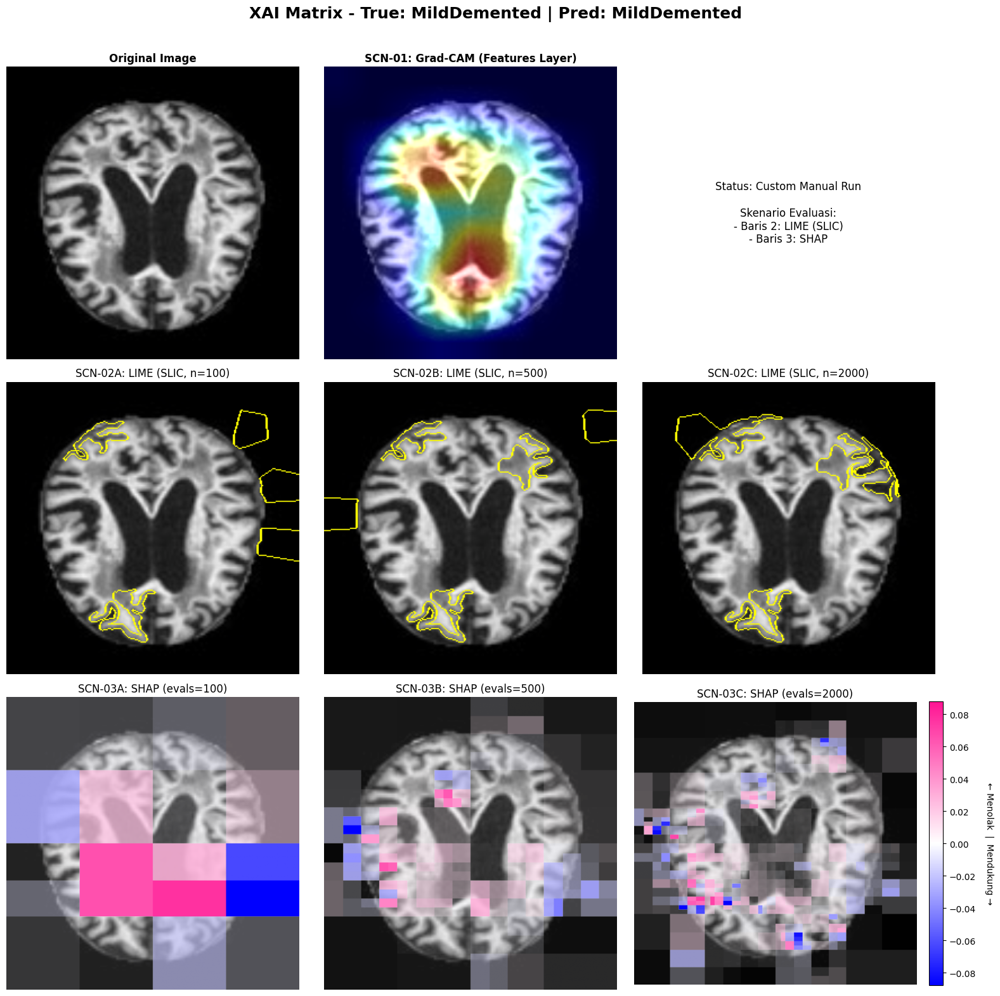

In [ ]:
import torch
import torch.nn as nn
from torchvision import models, transforms
from torch.utils.data import Dataset
from datasets import load_dataset
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import random
import cv2
import shap
from lime import lime_image
from skimage.segmentation import mark_boundaries
from lime.wrappers.scikit_image import SegmentationAlgorithm
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay
import seaborn as sns
from torch.utils.data import DataLoader

# =========================
# 1. SETUP & DEVICE
# =========================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

# =========================
# 2. MODEL INITIALIZATION
# =========================
from torchvision.models import efficientnet_b2, EfficientNet_B2_Weights

num_classes = 4

# Gunakan B2
model = efficientnet_b2(weights=EfficientNet_B2_Weights.DEFAULT)

num_ftrs = model.classifier[1].in_features # 1408 untuk EfficientNet-B2

# 🔥 Sesuaikan classifier dengan struktur saat training (berdasarkan pesan error)
model.classifier = nn.Sequential(
    nn.Dropout(p=0.3, inplace=False),  # [0] Dropout (bawaan B2)
    nn.Linear(num_ftrs, 512),          # [1] Hidden layer (512 neuron)
    nn.ReLU(inplace=False),            # [2] Activation (ReLU tanpa inplace)
    nn.Dropout(p=0.5, inplace=False),  # [3] Dropout tambahan
    nn.Linear(512, num_classes)        # [4] Output layer (4 kelas)
)

# Load weights dari path
model_path = "/content/drive/MyDrive/Alzheimer_EfficientNet_Models_Sampler/model_S16_AdamW_CosineAnnealingLR.pth"
model.load_state_dict(torch.load(model_path, map_location=device))

# Matikan inplace ReLU/SiLU untuk keseluruhan model
def disable_inplace_relu(module):
    for child_name, child in module.named_children():
        if isinstance(child, nn.ReLU):
            setattr(module, child_name, nn.ReLU(inplace=False))
        elif isinstance(child, nn.SiLU):
            setattr(module, child_name, nn.SiLU(inplace=False))
        else:
            disable_inplace_relu(child)

disable_inplace_relu(model)
model = model.to(device)
model.eval()
# =========================
# 3. DATA PREPARATION
# =========================
dataset = load_dataset("Falah/Alzheimer_MRI")
test_data = dataset["test"]

class AlzheimerDataset(Dataset):
    def __init__(self, hf_data, transform=None):
        self.data = hf_data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]
        image = item["image"].convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, item["label"]

transform = transforms.Compose([
    transforms.Resize((260,260)),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406], [0.229,0.224,0.225])
])

dataset_obj = AlzheimerDataset(test_data, transform)

def unnormalize(img_tensor):
    mean, std = np.array([0.485, 0.456, 0.406]), np.array([0.229, 0.224, 0.225])
    img = img_tensor.permute(1,2,0).detach().cpu().numpy()
    img = std * img + mean
    return np.clip(img, 0, 1)

print(f"Total data test yang siap dievaluasi: {len(dataset_obj)} gambar")

# =========================
# 4. EXPLAINERS SETUP (MODIFIKASI EFFICIENTNET)
# =========================
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer

    def fwd(self, module, inp, out):
        self.activations = out.detach().clone()

    def bwd(self, module, grad_in, grad_out):
        self.gradients = grad_out[0].detach().clone()

    def generate(self, x, cls):
        fwd_handle = self.target_layer.register_forward_hook(self.fwd)
        bwd_handle = self.target_layer.register_full_backward_hook(self.bwd)
        try:
            self.model.zero_grad()
            out = self.model(x)
            score = out[:, cls]
            score.backward()
            weights = self.gradients.mean(dim=[2,3], keepdim=True)
            cam = (weights * self.activations).sum(dim=1)
            cam = torch.relu(cam).squeeze().cpu().numpy()
            cam = cv2.resize(cam, (260,260))
            return (cam - cam.min()) / (cam.max() + 1e-8)
        finally:
            fwd_handle.remove()
            bwd_handle.remove()

# 🔥 Pada EfficientNet, target layer terakhir ada di features block terakhir
gradcam = GradCAM(model, model.features[-1])

explainer_lime = lime_image.LimeImageExplainer()
segmenter_slic = SegmentationAlgorithm('slic', n_segments=100, compactness=10, sigma=1)

def lime_predict(images):
    images = torch.tensor(images).permute(0,3,1,2).float().to(device)
    with torch.no_grad(): return torch.softmax(model(images), dim=1).cpu().numpy()

def shap_predict(images):
    images_tensor = torch.tensor(images).permute(0, 3, 1, 2).float().to(device)
    with torch.no_grad():
        preds = model(images_tensor)
    return preds.cpu().numpy()

masker = shap.maskers.Image("blur(28,28)", (260, 260, 3))
explainer_shap = shap.Explainer(shap_predict, masker)


# =========================
# 5. VISUALIZATION FUNCTION
# =========================
def get_shap_overlay(img_np, sv_heatmap):
    max_val = np.max(np.abs(sv_heatmap))
    vmax = max_val if max_val > 0 else 1.0
    vmin = -vmax

    img_gray = cv2.cvtColor((img_np * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY) / 255.0
    img_gray_3c = np.stack([img_gray]*3, axis=-1)
    norm_sv = (sv_heatmap - vmin) / (vmax - vmin)

    custom_colors = ["blue", "white", "deeppink"]
    cmap = LinearSegmentedColormap.from_list("blue_white_pink", custom_colors)
    shap_rgba = cmap(norm_sv)

    alpha_mask = np.abs(sv_heatmap) / vmax
    shap_rgba[:, :, 3] = np.clip(np.power(alpha_mask, 0.6) * 1.8, 0, 1)

    return img_gray_3c, shap_rgba, cmap, vmin, vmax

def run_xai_matrix(sample):
    img = sample["image"]
    img_np = unnormalize(img)
    x = img.unsqueeze(0).to(device)
    pred = sample["pred"]

    fig, axes = plt.subplots(3, 3, figsize=(16, 16))
    fig.suptitle(f"XAI Matrix - True: {sample['label']} | Pred: {sample['pred_name']}", fontsize=18, fontweight='bold', y=0.98)

    # --- BARIS 1: SCN-01 ---
    axes[0, 0].imshow(img_np)
    axes[0, 0].set_title("Original Image", fontsize=12, fontweight='bold')
    axes[0, 0].axis('off')

    cam = gradcam.generate(x, pred)
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
    heatmap_rgb = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    grad_img = (heatmap_rgb * 0.4 / 255.0) + img_np
    grad_img = np.clip(grad_img, 0, 1)

    axes[0, 1].imshow(grad_img)
    axes[0, 1].set_title("SCN-01: Grad-CAM (Features Layer)", fontsize=12, fontweight='bold')
    axes[0, 1].axis('off')

    axes[0, 2].axis('off')
    axes[0, 2].text(0.5, 0.5, f"Status: {sample['status']}\n\nSkenario Evaluasi:\n- Baris 2: LIME (SLIC)\n- Baris 3: SHAP",
                    ha='center', va='center', fontsize=12, wrap=True)

    # --- BARIS 2: SCN-02 ---
    lime_samples = [100, 500, 2000]
    print("Mengeksekusi Skenario LIME...")
    for idx, n_samp in enumerate(lime_samples):
        explanation = explainer_lime.explain_instance(
            img_np, lime_predict, top_labels=1, num_samples=n_samp, segmentation_fn=segmenter_slic
        )
        lime_img, mask = explanation.get_image_and_mask(
            explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=False
        )
        lime_img_bound = mark_boundaries(lime_img, mask)

        ax = axes[1, idx]
        ax.imshow(lime_img_bound)
        ax.set_title(f"SCN-02{chr(65+idx)}: LIME (SLIC, n={n_samp})", fontsize=12)
        ax.axis('off')

    # --- BARIS 3: SCN-03 ---
    shap_evals = [100, 500, 2000]
    img_np_nhwc = np.expand_dims(img_np, axis=0)

    print("Mengeksekusi Skenario SHAP...")
    for idx, evals in enumerate(shap_evals):
        shap_vals = explainer_shap(img_np_nhwc, max_evals=evals, batch_size=50)
        sv_array = shap_vals.values[0, ..., pred]
        sv_heatmap = sv_array.sum(axis=-1)

        img_gray_3c, shap_rgba, cmap, vmin, vmax = get_shap_overlay(img_np, sv_heatmap)

        ax = axes[2, idx]
        ax.imshow(img_gray_3c)
        ax.imshow(shap_rgba)
        ax.set_title(f"SCN-03{chr(65+idx)}: SHAP (evals={evals})", fontsize=12)
        ax.axis('off')

        if idx == 2:
            sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
            sm.set_array([])
            cbar = fig.colorbar(sm, ax=ax, orientation='vertical', fraction=0.046, pad=0.04)
            cbar.set_label('← Menolak  |  Mendukung →', rotation=270, labelpad=20)

    plt.tight_layout()
    plt.subplots_adjust(top=0.92)
    plt.show()

# =========================
# 6. TEST EVALUATION & CONFUSION MATRIX
# =========================
print("Mengevaluasi seluruh data test...")
test_loader = DataLoader(dataset_obj, batch_size=32, shuffle=False)

all_preds = []
all_labels = []

model.eval()
with torch.no_grad():
    for images, labels_batch in test_loader:
        images = images.to(device)
        outputs = model(images)
        preds = outputs.argmax(dim=1).cpu().numpy()

        all_preds.extend(preds)
        all_labels.extend(labels_batch.numpy())

all_preds = np.array(all_preds)
all_labels = np.array(all_labels)

target_names = ["MildDemented", "ModerateDemented", "NonDemented", "VeryMildDemented"]

print("\n=== CLASSIFICATION REPORT ===")
print(classification_report(all_labels, all_preds, target_names=target_names, digits=4))

# =========================
# 7. PREPARING 20 SAMPLES (INDEX TETAP)
# =========================
fixed_indices_dict = {
    "MildDemented": [1249, 157, 460, 646, 996],
    "ModerateDemented": [250, 209, 1133, 139, 929],
    "NonDemented": [1129, 195, 1074, 940, 281],
    "VeryMildDemented": [34, 119, 782, 1233, 299]
}

selected_samples = []

for target_class_name, indices in fixed_indices_dict.items():
    class_idx = target_names.index(target_class_name)
    for idx in indices:
        img, gt_label = dataset_obj[idx]
        pred_label = all_preds[idx]

        if gt_label == class_idx and pred_label == class_idx:
            status = "TP (Tebakan Benar)"
        elif gt_label == class_idx and pred_label != class_idx:
            status = f"FN (Asli {target_names[gt_label]}, ditebak {target_names[pred_label]})"
        elif gt_label != class_idx and pred_label == class_idx:
            status = f"FP (Asli {target_names[gt_label]}, salah ditebak {target_names[pred_label]})"
        else:
            if gt_label == pred_label:
                status = f"True Negative (Benar Kelas {target_names[gt_label]})"
            else:
                status = f"Salah Prediksi (Asli {target_names[gt_label]}, ditebak {target_names[pred_label]})"

        selected_samples.append({
            "idx": idx, "image": img, "label": target_names[gt_label],
            "pred": pred_label, "pred_name": target_names[pred_label],
            "status": status, "target_class": target_class_name
        })


# =========================
# 8. KONTROL EKSEKUSI XAI (PILIH 1 ATAU 20 SAMPEL)
# =========================
# 🔥 UBAH PENGATURAN DI BAWAH INI SESUAI KEBUTUHAN 🔥
EXECUTION_MODE = "single"  # Pilihan: "single" atau "all"
CUSTOM_INDEX = 1249        # Masukkan index data spesifik jika memilih mode "single"

if EXECUTION_MODE == "single":
    print(f"\nMenjalankan XAI khusus untuk Dataset Index: {CUSTOM_INDEX}")

    img, gt_label = dataset_obj[CUSTOM_INDEX]
    pred_label = all_preds[CUSTOM_INDEX]

    custom_sample = {
        "idx": CUSTOM_INDEX,
        "image": img,
        "label": target_names[gt_label],
        "pred": pred_label,
        "pred_name": target_names[pred_label],
        "status": "Custom Manual Run",
        "target_class": target_names[gt_label]
    }

    print(f"\n{'='*65}")
    print(f"💡 PROCESSING SINGLE SAMPLE")
    print(f"Dataset Index  : {custom_sample['idx']}")
    print(f"GT Label       : {custom_sample['label']}")
    print(f"Predicted      : {custom_sample['pred_name']}")
    print(f"{'='*65}")

    run_xai_matrix(custom_sample)

elif EXECUTION_MODE == "all":
    print(f"\nMenjalankan MATRIX XAI untuk total {len(selected_samples)} sampel terpilih...")
    for i, s in enumerate(selected_samples):
        print(f"\n{'='*65}")
        print(f"💡 PROCESSING SAMPLE {i+1}/{len(selected_samples)}")
        print(f"Dataset Index  : {s['idx']}")
        print(f"Evaluasi Kelas : {s['target_class']}")
        print(f"Status         : {s['status']}")
        print(f"{'='*65}")

        run_xai_matrix(s)
else:
    print("EXECUTION_MODE tidak valid. Pilih 'single' atau 'all'.")

# PIPELINE 3

In [ ]:
# ========================================================
# PIPELINE 3: QUANTITATIVE EVALUATION ENGINE (EFFICIENTNET-B2) - STANDALONE
# ========================================================
import torch
import numpy as np
import time
import cv2
from sklearn.metrics import auc
import pandas as pd
import os
import shap
from lime import lime_image
from lime.wrappers.scikit_image import SegmentationAlgorithm

# --- 1. CONFIGURATION & DEPENDENCIES ---
# Pastikan `model` dan `dataset_obj` sudah ter-load dari Pipeline 1
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

EXECUTION_MODE = "class"           # Pilih: "single", "class", atau "all"
CUSTOM_INDEX = 1249                # Berlaku jika mode "single"
CUSTOM_CLASS = "MildDemented"  # Berlaku jika mode "class"

TARGET_NAMES = ["MildDemented", "ModerateDemented", "NonDemented", "VeryMildDemented"]

# Dictionary khusus hasil evaluasi EfficientNet-B2
FIXED_INDICES_DICT = {
    "MildDemented": [125, 651, 460, 59, 599, 1016, 124, 709, 604, 362, 662, 942, 1110, 1069, 993],
    "ModerateDemented": [70, 139, 209, 250, 306, 435, 476, 496, 502, 840, 929, 1133, 1136, 1215, 1216],
    "NonDemented": [478, 390, 801, 20, 1132, 333, 547, 1000, 6, 338, 1165, 298, 491, 428, 8],
    "VeryMildDemented": [5, 875, 1269, 94, 61, 436, 811, 1089, 1024, 932, 743, 475, 777, 712, 449]
}

# --- 2. INITIALIZE EXPLAINERS (Standalone) ---
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.activations = None
        self.gradients = None

    def fwd_hook(self, module, inp, out):
        self.activations = out.detach().clone()

    def bwd_hook(self, module, grad_in, grad_out):
        self.gradients = grad_out[0].detach().clone()

    def generate(self, x, cls):
        fwd_handle = self.target_layer.register_forward_hook(self.fwd_hook)
        bwd_handle = self.target_layer.register_full_backward_hook(self.bwd_hook)
        try:
            self.model.zero_grad()
            # Memastikan gradien direkam
            x.requires_grad_()
            out = self.model(x)
            score = out[:, cls]
            score.backward()

            weights = self.gradients.mean(dim=[2, 3], keepdim=True)
            cam = (weights * self.activations).sum(dim=1)
            cam = torch.relu(cam).squeeze().cpu().numpy()

            # Perlindungan area kosong & Disesuaikan untuk ukuran EfficientNet-B2 (260x260)
            if cam.max() == 0:
                return cv2.resize(cam, (260, 260))

            cam = cv2.resize(cam, (260, 260))
            return (cam - cam.min()) / (cam.max() + 1e-8)
        finally:
            fwd_handle.remove()
            bwd_handle.remove()

# Target layer disesuaikan untuk EfficientNet
gradcam = GradCAM(model, model.features[-1])
explainer_lime = lime_image.LimeImageExplainer()
segmenter_slic = SegmentationAlgorithm('slic', n_segments=100, compactness=10, sigma=1)
# Ukuran disesuaikan untuk EfficientNet-B2 (260x260)
masker = shap.maskers.Image("blur(28,28)", (260, 260, 3))

def lime_predict(images):
    images_tensor = torch.tensor(images).permute(0, 3, 1, 2).float().to(device)
    with torch.no_grad():
        return torch.softmax(model(images_tensor), dim=1).cpu().numpy()

def shap_predict(images):
    images_tensor = torch.tensor(images).permute(0, 3, 1, 2).float().to(device)
    with torch.no_grad():
        return model(images_tensor).cpu().numpy()

explainer_shap = shap.Explainer(shap_predict, masker)


# --- 3. METRICS CALCULATOR FUNCTIONS ---
def calculate_sparsity(heatmap, threshold=0.2):
    """Menghitung rasio piksel yang tidak relevan (mendekati 0)"""
    norm_heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min() + 1e-8)
    sparse_pixels = np.sum(norm_heatmap < threshold)
    total_pixels = heatmap.size
    return sparse_pixels / total_pixels

def calculate_deletion_insertion(model, img_tensor, heatmap, target_class, step=0.1):
    """Menghitung metrik Deletion (AUC) dan Insertion (AUC)"""
    device = img_tensor.device
    heatmap = cv2.resize(heatmap, (260, 260)) # Ukuran disesuaikan (260x260)
    heatmap_flat = heatmap.flatten()

    # Mencegah error negative stride pada NumPy ke PyTorch
    sorted_indices = np.argsort(heatmap_flat)[::-1].copy()

    total_pixels = len(heatmap_flat)
    steps = np.arange(0, 1.0 + step, step)

    del_scores, ins_scores = [], []
    baseline_img = torch.zeros_like(img_tensor)

    with torch.no_grad():
        for s in steps:
            num_pixels = int(s * total_pixels)
            mask_indices = sorted_indices[:num_pixels]

            # Deletion (Menggunakan dimensi 260x260)
            del_img = img_tensor.clone().view(3, -1)
            del_img[:, mask_indices] = 0
            del_img = del_img.view(1, 3, 260, 260)
            del_out = torch.softmax(model(del_img), dim=1)
            del_scores.append(del_out[0, target_class].item())

            # Insertion (Menggunakan dimensi 260x260)
            ins_img = baseline_img.clone().view(3, -1)
            ins_img[:, mask_indices] = img_tensor.view(3, -1)[:, mask_indices]
            ins_img = ins_img.view(1, 3, 260, 260)
            ins_out = torch.softmax(model(ins_img), dim=1)
            ins_scores.append(ins_out[0, target_class].item())

    return auc(steps, del_scores), auc(steps, ins_scores)

def calculate_robustness(method_func, img_tensor, original_heatmap, noise_level=0.02):
    """Menghitung stabilitas penjelasan terhadap noise kecil (Skor 0-1)"""
    noise = torch.randn_like(img_tensor) * noise_level
    noisy_img = torch.clamp(img_tensor + noise, 0, 1)

    noisy_heatmap = method_func(noisy_img)

    orig_norm = (original_heatmap - original_heatmap.min()) / (original_heatmap.max() - original_heatmap.min() + 1e-8)
    noisy_norm = (noisy_heatmap - noisy_heatmap.min()) / (noisy_heatmap.max() - noisy_heatmap.min() + 1e-8)

    mse = np.mean((orig_norm - noisy_norm) ** 2)
    return 1.0 - np.clip(mse, 0, 1)

# --- 4. XAI WRAPPERS ---
def get_gradcam_heatmap(img_t, target_label):
    img_t.requires_grad_()
    return gradcam.generate(img_t, target_label)

def get_lime_heatmap(img_np, target_label, num_samples):
    explanation = explainer_lime.explain_instance(
        img_np, lime_predict, top_labels=1, num_samples=num_samples, segmentation_fn=segmenter_slic
    )
    dict_heatmap = dict(explanation.local_exp[explanation.top_labels[0]])
    heatmap = np.zeros(explanation.segments.shape)
    for seg_val, weight in dict_heatmap.items():
        heatmap[explanation.segments == seg_val] = weight
    return cv2.resize(heatmap, (260, 260)) # Ukuran disesuaikan (260x260)

def get_shap_heatmap(img_np, target_label, evals):
    img_nhwc = np.expand_dims(img_np, axis=0)
    shap_vals = explainer_shap(img_nhwc, max_evals=evals, batch_size=50)
    sv_heatmap = shap_vals.values[0, ..., target_label].sum(axis=-1)
    return cv2.resize(sv_heatmap, (260, 260)) # Ukuran disesuaikan (260x260)

# --- 5. CORE EVALUATION ENGINE ---
def run_quantitative_eval(idx, class_name):
    print(f"\n[{idx}] Mengekstrak Metrik XAI (Kelas: {class_name})...")
    img, gt_label = dataset_obj[idx]
    img_np = unnormalize(img)
    x = img.unsqueeze(0).to(device)

    with torch.no_grad():
        pred_label = model(x).argmax(dim=1).item()

    results = []

    def append_res(scn_name, del_s, ins_s, rob_s, spa_s, cost_s):
        results.append({
            "Index": idx,
            "Kelas": class_name,
            "Skenario": scn_name,
            "Deletion (↓)": del_s,
            "Insertion (↑)": ins_s,
            "Robustness (↑)": rob_s,
            "Sparsity (↑)": spa_s,
            "Cost (Sec) (↓)": cost_s
        })

    # --- SCN-01: Grad-CAM ---
    t0 = time.time()
    hm_gc = get_gradcam_heatmap(x, pred_label)
    cost_gc = time.time() - t0
    del_gc, ins_gc = calculate_deletion_insertion(model, x[0], hm_gc, pred_label)
    rob_gc = calculate_robustness(lambda t: get_gradcam_heatmap(t.unsqueeze(0), pred_label), x[0], hm_gc)
    append_res("SCN-01: Grad-CAM", del_gc, ins_gc, rob_gc, calculate_sparsity(hm_gc), cost_gc)

    # --- SCN-02: LIME ---
    for n in [100, 500, 2000]:
        t0 = time.time()
        hm_lm = get_lime_heatmap(img_np, pred_label, num_samples=n)
        cost_lm = time.time() - t0
        del_lm, ins_lm = calculate_deletion_insertion(model, x[0], hm_lm, pred_label)
        rob_lm = calculate_robustness(lambda t: get_lime_heatmap(unnormalize(t.cpu()), pred_label, num_samples=n), x[0].cpu(), hm_lm)
        append_res(f"SCN-02: LIME (n={n})", del_lm, ins_lm, rob_lm, calculate_sparsity(hm_lm), cost_lm)

    # --- SCN-03: SHAP ---
    for ev in [100, 500, 2000]:
        t0 = time.time()
        hm_sh = get_shap_heatmap(img_np, pred_label, evals=ev)
        cost_sh = time.time() - t0
        del_sh, ins_sh = calculate_deletion_insertion(model, x[0], hm_sh, pred_label)
        rob_sh = calculate_robustness(lambda t: get_shap_heatmap(unnormalize(t.cpu()), pred_label, evals=ev), x[0].cpu(), hm_sh)
        append_res(f"SCN-03: SHAP (e={ev})", del_sh, ins_sh, rob_sh, calculate_sparsity(hm_sh), cost_sh)

    return pd.DataFrame(results)

# --- 6. EXECUTION HANDLER & CSV MANAGER ---
# ⚠️ Nama file diubah khusus untuk model EfficientNet
CSV_FILENAME = "xai_metrics_history_efficientnet.csv"

def save_and_summarize(new_df):
    """Menyimpan data baru ke CSV dan menghitung rata-rata global dari file"""
    file_exists = os.path.isfile(CSV_FILENAME)

    new_df.to_csv(CSV_FILENAME, mode='a', header=not file_exists, index=False)
    print(f"\n✅ Data berhasil ditambahkan ke '{CSV_FILENAME}'")

    full_df = pd.read_csv(CSV_FILENAME)
    total_images = full_df['Index'].nunique()

    global_avg = full_df.groupby("Skenario", as_index=False).mean(numeric_only=True)

    if 'Index' in global_avg.columns:
        global_avg = global_avg.drop(columns=['Index'])

    print(f"\n{'='*70}")
    print(f"📊 RATA-RATA GLOBAL SAAT INI (Berdasarkan {total_images} gambar di CSV EfficientNet)")
    print(f"{'='*70}")
    print(global_avg.to_string(index=False))
    print(f"{'='*70}\n")


# --- EKSEKUSI ---
all_dfs = []

if EXECUTION_MODE == "single":
    cls_name = "Unknown"
    for c, indices in FIXED_INDICES_DICT.items():
        if CUSTOM_INDEX in indices: cls_name = c

    df = run_quantitative_eval(CUSTOM_INDEX, cls_name)
    save_and_summarize(df)

elif EXECUTION_MODE == "class":
    if CUSTOM_CLASS in FIXED_INDICES_DICT:
        indices = FIXED_INDICES_DICT[CUSTOM_CLASS]
        print(f"\nMemulai Evaluasi Kuantitatif untuk {len(indices)} sampel di kelas {CUSTOM_CLASS}...")
        for idx in indices:
            df = run_quantitative_eval(idx, CUSTOM_CLASS)
            all_dfs.append(df)

        final_df = pd.concat(all_dfs, ignore_index=True)
        save_and_summarize(final_df)
    else:
        print("❌ Kelas tidak valid.")

elif EXECUTION_MODE == "all":
    print("\nMemulai Evaluasi Kuantitatif untuk SELURUH sampel...")
    for cls_name, indices in FIXED_INDICES_DICT.items():
        for idx in indices:
            df = run_quantitative_eval(idx, cls_name)
            all_dfs.append(df)

    final_df = pd.concat(all_dfs, ignore_index=True)
    save_and_summarize(final_df)


Memulai Evaluasi Kuantitatif untuk 15 sampel di kelas MildDemented...

[125] Mengekstrak Metrik XAI (Kelas: MildDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/98 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:34, 34.36s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:16, 16.15s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:17, 17.60s/it]               



[651] Mengekstrak Metrik XAI (Kelas: MildDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.00s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.26s/it]               



[460] Mengekstrak Metrik XAI (Kelas: MildDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.55s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.66s/it]               



[59] Mengekstrak Metrik XAI (Kelas: MildDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.00s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.38s/it]               



[599] Mengekstrak Metrik XAI (Kelas: MildDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.21s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.57s/it]               



[1016] Mengekstrak Metrik XAI (Kelas: MildDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:12, 12.95s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.45s/it]               



[124] Mengekstrak Metrik XAI (Kelas: MildDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.31s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.61s/it]               



[709] Mengekstrak Metrik XAI (Kelas: MildDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.34s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.45s/it]               



[604] Mengekstrak Metrik XAI (Kelas: MildDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.38s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.82s/it]               



[362] Mengekstrak Metrik XAI (Kelas: MildDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.38s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.74s/it]               



[662] Mengekstrak Metrik XAI (Kelas: MildDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.32s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.64s/it]               



[942] Mengekstrak Metrik XAI (Kelas: MildDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.09s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.41s/it]               



[1110] Mengekstrak Metrik XAI (Kelas: MildDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.39s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.73s/it]               



[1069] Mengekstrak Metrik XAI (Kelas: MildDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.86s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 14.00s/it]               



[993] Mengekstrak Metrik XAI (Kelas: MildDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.81s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:14, 14.21s/it]               


✅ Data berhasil ditambahkan ke 'xai_metrics_history_efficientnet.csv'

📊 RATA-RATA GLOBAL SAAT INI (Berdasarkan 15 gambar di CSV EfficientNet)
             Skenario  Deletion (↓)  Insertion (↑)  Robustness (↑)  Sparsity (↑)  Cost (Sec) (↓)
     SCN-01: Grad-CAM      0.386506       0.648644        0.930653      0.765366        0.082441
 SCN-02: LIME (n=100)      0.379156       0.359908        0.899883      0.054474        1.803022
SCN-02: LIME (n=2000)      0.471159       0.352655        0.896058      0.042339       18.896643
 SCN-02: LIME (n=500)      0.462896       0.348474        0.902610      0.057121        5.481326
 SCN-03: SHAP (e=100)      0.541629       0.555161        0.807020      0.116603        3.101266
SCN-03: SHAP (e=2000)      0.436504       0.452396        0.910648      0.019042       13.526907
 SCN-03: SHAP (e=500)      0.483907       0.446530        0.893665      0.026074        3.213015



In [ ]:
# ========================================================
# PIPELINE 3: QUANTITATIVE EVALUATION ENGINE (EFFICIENTNET-B2) - STANDALONE
# ========================================================
import torch
import numpy as np
import time
import cv2
from sklearn.metrics import auc
import pandas as pd
import os
import shap
from lime import lime_image
from lime.wrappers.scikit_image import SegmentationAlgorithm

# --- 1. CONFIGURATION & DEPENDENCIES ---
# Pastikan `model` dan `dataset_obj` sudah ter-load dari Pipeline 1
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

EXECUTION_MODE = "class"           # Pilih: "single", "class", atau "all"
CUSTOM_INDEX = 1249                # Berlaku jika mode "single"
CUSTOM_CLASS = "ModerateDemented"  # Berlaku jika mode "class"

TARGET_NAMES = ["MildDemented", "ModerateDemented", "NonDemented", "VeryMildDemented"]

# Dictionary khusus hasil evaluasi EfficientNet-B2
FIXED_INDICES_DICT = {
    "MildDemented": [125, 651, 460, 59, 599, 1016, 124, 709, 604, 362, 662, 942, 1110, 1069, 993],
    "ModerateDemented": [70, 139, 209, 250, 306, 435, 476, 496, 502, 840, 929, 1133, 1136, 1215, 1216],
    "NonDemented": [478, 390, 801, 20, 1132, 333, 547, 1000, 6, 338, 1165, 298, 491, 428, 8],
    "VeryMildDemented": [5, 875, 1269, 94, 61, 436, 811, 1089, 1024, 932, 743, 475, 777, 712, 449]
}

# --- 2. INITIALIZE EXPLAINERS (Standalone) ---
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.activations = None
        self.gradients = None

    def fwd_hook(self, module, inp, out):
        self.activations = out.detach().clone()

    def bwd_hook(self, module, grad_in, grad_out):
        self.gradients = grad_out[0].detach().clone()

    def generate(self, x, cls):
        fwd_handle = self.target_layer.register_forward_hook(self.fwd_hook)
        bwd_handle = self.target_layer.register_full_backward_hook(self.bwd_hook)
        try:
            self.model.zero_grad()
            # Memastikan gradien direkam
            x.requires_grad_()
            out = self.model(x)
            score = out[:, cls]
            score.backward()

            weights = self.gradients.mean(dim=[2, 3], keepdim=True)
            cam = (weights * self.activations).sum(dim=1)
            cam = torch.relu(cam).squeeze().cpu().numpy()

            # Perlindungan area kosong & Disesuaikan untuk ukuran EfficientNet-B2 (260x260)
            if cam.max() == 0:
                return cv2.resize(cam, (260, 260))

            cam = cv2.resize(cam, (260, 260))
            return (cam - cam.min()) / (cam.max() + 1e-8)
        finally:
            fwd_handle.remove()
            bwd_handle.remove()

# Target layer disesuaikan untuk EfficientNet
gradcam = GradCAM(model, model.features[-1])
explainer_lime = lime_image.LimeImageExplainer()
segmenter_slic = SegmentationAlgorithm('slic', n_segments=100, compactness=10, sigma=1)
# Ukuran disesuaikan untuk EfficientNet-B2 (260x260)
masker = shap.maskers.Image("blur(28,28)", (260, 260, 3))

def lime_predict(images):
    images_tensor = torch.tensor(images).permute(0, 3, 1, 2).float().to(device)
    with torch.no_grad():
        return torch.softmax(model(images_tensor), dim=1).cpu().numpy()

def shap_predict(images):
    images_tensor = torch.tensor(images).permute(0, 3, 1, 2).float().to(device)
    with torch.no_grad():
        return model(images_tensor).cpu().numpy()

explainer_shap = shap.Explainer(shap_predict, masker)


# --- 3. METRICS CALCULATOR FUNCTIONS ---
def calculate_sparsity(heatmap, threshold=0.2):
    """Menghitung rasio piksel yang tidak relevan (mendekati 0)"""
    norm_heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min() + 1e-8)
    sparse_pixels = np.sum(norm_heatmap < threshold)
    total_pixels = heatmap.size
    return sparse_pixels / total_pixels

def calculate_deletion_insertion(model, img_tensor, heatmap, target_class, step=0.1):
    """Menghitung metrik Deletion (AUC) dan Insertion (AUC)"""
    device = img_tensor.device
    heatmap = cv2.resize(heatmap, (260, 260)) # Ukuran disesuaikan (260x260)
    heatmap_flat = heatmap.flatten()

    # Mencegah error negative stride pada NumPy ke PyTorch
    sorted_indices = np.argsort(heatmap_flat)[::-1].copy()

    total_pixels = len(heatmap_flat)
    steps = np.arange(0, 1.0 + step, step)

    del_scores, ins_scores = [], []
    baseline_img = torch.zeros_like(img_tensor)

    with torch.no_grad():
        for s in steps:
            num_pixels = int(s * total_pixels)
            mask_indices = sorted_indices[:num_pixels]

            # Deletion (Menggunakan dimensi 260x260)
            del_img = img_tensor.clone().view(3, -1)
            del_img[:, mask_indices] = 0
            del_img = del_img.view(1, 3, 260, 260)
            del_out = torch.softmax(model(del_img), dim=1)
            del_scores.append(del_out[0, target_class].item())

            # Insertion (Menggunakan dimensi 260x260)
            ins_img = baseline_img.clone().view(3, -1)
            ins_img[:, mask_indices] = img_tensor.view(3, -1)[:, mask_indices]
            ins_img = ins_img.view(1, 3, 260, 260)
            ins_out = torch.softmax(model(ins_img), dim=1)
            ins_scores.append(ins_out[0, target_class].item())

    return auc(steps, del_scores), auc(steps, ins_scores)

def calculate_robustness(method_func, img_tensor, original_heatmap, noise_level=0.02):
    """Menghitung stabilitas penjelasan terhadap noise kecil (Skor 0-1)"""
    noise = torch.randn_like(img_tensor) * noise_level
    noisy_img = torch.clamp(img_tensor + noise, 0, 1)

    noisy_heatmap = method_func(noisy_img)

    orig_norm = (original_heatmap - original_heatmap.min()) / (original_heatmap.max() - original_heatmap.min() + 1e-8)
    noisy_norm = (noisy_heatmap - noisy_heatmap.min()) / (noisy_heatmap.max() - noisy_heatmap.min() + 1e-8)

    mse = np.mean((orig_norm - noisy_norm) ** 2)
    return 1.0 - np.clip(mse, 0, 1)

# --- 4. XAI WRAPPERS ---
def get_gradcam_heatmap(img_t, target_label):
    img_t.requires_grad_()
    return gradcam.generate(img_t, target_label)

def get_lime_heatmap(img_np, target_label, num_samples):
    explanation = explainer_lime.explain_instance(
        img_np, lime_predict, top_labels=1, num_samples=num_samples, segmentation_fn=segmenter_slic
    )
    dict_heatmap = dict(explanation.local_exp[explanation.top_labels[0]])
    heatmap = np.zeros(explanation.segments.shape)
    for seg_val, weight in dict_heatmap.items():
        heatmap[explanation.segments == seg_val] = weight
    return cv2.resize(heatmap, (260, 260)) # Ukuran disesuaikan (260x260)

def get_shap_heatmap(img_np, target_label, evals):
    img_nhwc = np.expand_dims(img_np, axis=0)
    shap_vals = explainer_shap(img_nhwc, max_evals=evals, batch_size=50)
    sv_heatmap = shap_vals.values[0, ..., target_label].sum(axis=-1)
    return cv2.resize(sv_heatmap, (260, 260)) # Ukuran disesuaikan (260x260)

# --- 5. CORE EVALUATION ENGINE ---
def run_quantitative_eval(idx, class_name):
    print(f"\n[{idx}] Mengekstrak Metrik XAI (Kelas: {class_name})...")
    img, gt_label = dataset_obj[idx]
    img_np = unnormalize(img)
    x = img.unsqueeze(0).to(device)

    with torch.no_grad():
        pred_label = model(x).argmax(dim=1).item()

    results = []

    def append_res(scn_name, del_s, ins_s, rob_s, spa_s, cost_s):
        results.append({
            "Index": idx,
            "Kelas": class_name,
            "Skenario": scn_name,
            "Deletion (↓)": del_s,
            "Insertion (↑)": ins_s,
            "Robustness (↑)": rob_s,
            "Sparsity (↑)": spa_s,
            "Cost (Sec) (↓)": cost_s
        })

    # --- SCN-01: Grad-CAM ---
    t0 = time.time()
    hm_gc = get_gradcam_heatmap(x, pred_label)
    cost_gc = time.time() - t0
    del_gc, ins_gc = calculate_deletion_insertion(model, x[0], hm_gc, pred_label)
    rob_gc = calculate_robustness(lambda t: get_gradcam_heatmap(t.unsqueeze(0), pred_label), x[0], hm_gc)
    append_res("SCN-01: Grad-CAM", del_gc, ins_gc, rob_gc, calculate_sparsity(hm_gc), cost_gc)

    # --- SCN-02: LIME ---
    for n in [100, 500, 2000]:
        t0 = time.time()
        hm_lm = get_lime_heatmap(img_np, pred_label, num_samples=n)
        cost_lm = time.time() - t0
        del_lm, ins_lm = calculate_deletion_insertion(model, x[0], hm_lm, pred_label)
        rob_lm = calculate_robustness(lambda t: get_lime_heatmap(unnormalize(t.cpu()), pred_label, num_samples=n), x[0].cpu(), hm_lm)
        append_res(f"SCN-02: LIME (n={n})", del_lm, ins_lm, rob_lm, calculate_sparsity(hm_lm), cost_lm)

    # --- SCN-03: SHAP ---
    for ev in [100, 500, 2000]:
        t0 = time.time()
        hm_sh = get_shap_heatmap(img_np, pred_label, evals=ev)
        cost_sh = time.time() - t0
        del_sh, ins_sh = calculate_deletion_insertion(model, x[0], hm_sh, pred_label)
        rob_sh = calculate_robustness(lambda t: get_shap_heatmap(unnormalize(t.cpu()), pred_label, evals=ev), x[0].cpu(), hm_sh)
        append_res(f"SCN-03: SHAP (e={ev})", del_sh, ins_sh, rob_sh, calculate_sparsity(hm_sh), cost_sh)

    return pd.DataFrame(results)

# --- 6. EXECUTION HANDLER & CSV MANAGER ---
# ⚠️ Nama file diubah khusus untuk model EfficientNet
CSV_FILENAME = "xai_metrics_history_efficientnet.csv"

def save_and_summarize(new_df):
    """Menyimpan data baru ke CSV dan menghitung rata-rata global dari file"""
    file_exists = os.path.isfile(CSV_FILENAME)

    new_df.to_csv(CSV_FILENAME, mode='a', header=not file_exists, index=False)
    print(f"\n✅ Data berhasil ditambahkan ke '{CSV_FILENAME}'")

    full_df = pd.read_csv(CSV_FILENAME)
    total_images = full_df['Index'].nunique()

    global_avg = full_df.groupby("Skenario", as_index=False).mean(numeric_only=True)

    if 'Index' in global_avg.columns:
        global_avg = global_avg.drop(columns=['Index'])

    print(f"\n{'='*70}")
    print(f"📊 RATA-RATA GLOBAL SAAT INI (Berdasarkan {total_images} gambar di CSV EfficientNet)")
    print(f"{'='*70}")
    print(global_avg.to_string(index=False))
    print(f"{'='*70}\n")


# --- EKSEKUSI ---
all_dfs = []

if EXECUTION_MODE == "single":
    cls_name = "Unknown"
    for c, indices in FIXED_INDICES_DICT.items():
        if CUSTOM_INDEX in indices: cls_name = c

    df = run_quantitative_eval(CUSTOM_INDEX, cls_name)
    save_and_summarize(df)

elif EXECUTION_MODE == "class":
    if CUSTOM_CLASS in FIXED_INDICES_DICT:
        indices = FIXED_INDICES_DICT[CUSTOM_CLASS]
        print(f"\nMemulai Evaluasi Kuantitatif untuk {len(indices)} sampel di kelas {CUSTOM_CLASS}...")
        for idx in indices:
            df = run_quantitative_eval(idx, CUSTOM_CLASS)
            all_dfs.append(df)

        final_df = pd.concat(all_dfs, ignore_index=True)
        save_and_summarize(final_df)
    else:
        print("❌ Kelas tidak valid.")

elif EXECUTION_MODE == "all":
    print("\nMemulai Evaluasi Kuantitatif untuk SELURUH sampel...")
    for cls_name, indices in FIXED_INDICES_DICT.items():
        for idx in indices:
            df = run_quantitative_eval(idx, cls_name)
            all_dfs.append(df)

    final_df = pd.concat(all_dfs, ignore_index=True)
    save_and_summarize(final_df)


Memulai Evaluasi Kuantitatif untuk 15 sampel di kelas ModerateDemented...

[70] Mengekstrak Metrik XAI (Kelas: ModerateDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:12, 12.69s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.47s/it]               



[139] Mengekstrak Metrik XAI (Kelas: ModerateDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.18s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.42s/it]               



[209] Mengekstrak Metrik XAI (Kelas: ModerateDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.30s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.60s/it]               



[250] Mengekstrak Metrik XAI (Kelas: ModerateDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.39s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.50s/it]               



[306] Mengekstrak Metrik XAI (Kelas: ModerateDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.58s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.32s/it]               



[435] Mengekstrak Metrik XAI (Kelas: ModerateDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.36s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.28s/it]               



[476] Mengekstrak Metrik XAI (Kelas: ModerateDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.06s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.28s/it]               



[496] Mengekstrak Metrik XAI (Kelas: ModerateDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.72s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.70s/it]               



[502] Mengekstrak Metrik XAI (Kelas: ModerateDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.23s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.46s/it]               



[840] Mengekstrak Metrik XAI (Kelas: ModerateDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.40s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:15, 15.21s/it]               



[929] Mengekstrak Metrik XAI (Kelas: ModerateDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.83s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.68s/it]               



[1133] Mengekstrak Metrik XAI (Kelas: ModerateDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.21s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.37s/it]               



[1136] Mengekstrak Metrik XAI (Kelas: ModerateDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.37s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.67s/it]               



[1215] Mengekstrak Metrik XAI (Kelas: ModerateDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:12, 12.97s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.40s/it]               



[1216] Mengekstrak Metrik XAI (Kelas: ModerateDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.13s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.26s/it]               


✅ Data berhasil ditambahkan ke 'xai_metrics_history_efficientnet.csv'

📊 RATA-RATA GLOBAL SAAT INI (Berdasarkan 30 gambar di CSV EfficientNet)
             Skenario  Deletion (↓)  Insertion (↑)  Robustness (↑)  Sparsity (↑)  Cost (Sec) (↓)
     SCN-01: Grad-CAM      0.533337       0.676051        0.934996      0.386116        0.060460
 SCN-02: LIME (n=100)      0.499325       0.545099        0.902137      0.061087        1.445661
SCN-02: LIME (n=2000)      0.561748       0.521714        0.905458      0.043096       19.082274
 SCN-02: LIME (n=500)      0.574704       0.522633        0.907038      0.058308        5.166117
 SCN-03: SHAP (e=100)      0.511247       0.552254        0.820024      0.128045        1.952408
SCN-03: SHAP (e=2000)      0.507766       0.530476        0.903343      0.024431       13.416252
 SCN-03: SHAP (e=500)      0.489597       0.468797        0.888547      0.032308        3.154945



In [ ]:
# ========================================================
# PIPELINE 3: QUANTITATIVE EVALUATION ENGINE (EFFICIENTNET-B2) - STANDALONE
# ========================================================
import torch
import numpy as np
import time
import cv2
from sklearn.metrics import auc
import pandas as pd
import os
import shap
from lime import lime_image
from lime.wrappers.scikit_image import SegmentationAlgorithm

# --- 1. CONFIGURATION & DEPENDENCIES ---
# Pastikan `model` dan `dataset_obj` sudah ter-load dari Pipeline 1
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

EXECUTION_MODE = "class"           # Pilih: "single", "class", atau "all"
CUSTOM_INDEX = 1249                # Berlaku jika mode "single"
CUSTOM_CLASS = "NonDemented"  # Berlaku jika mode "class"

TARGET_NAMES = ["MildDemented", "ModerateDemented", "NonDemented", "VeryMildDemented"]

# Dictionary khusus hasil evaluasi EfficientNet-B2
FIXED_INDICES_DICT = {
    "MildDemented": [125, 651, 460, 59, 599, 1016, 124, 709, 604, 362, 662, 942, 1110, 1069, 993],
    "ModerateDemented": [70, 139, 209, 250, 306, 435, 476, 496, 502, 840, 929, 1133, 1136, 1215, 1216],
    "NonDemented": [478, 390, 801, 20, 1132, 333, 547, 1000, 6, 338, 1165, 298, 491, 428, 8],
    "VeryMildDemented": [5, 875, 1269, 94, 61, 436, 811, 1089, 1024, 932, 743, 475, 777, 712, 449]
}

# --- 2. INITIALIZE EXPLAINERS (Standalone) ---
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.activations = None
        self.gradients = None

    def fwd_hook(self, module, inp, out):
        self.activations = out.detach().clone()

    def bwd_hook(self, module, grad_in, grad_out):
        self.gradients = grad_out[0].detach().clone()

    def generate(self, x, cls):
        fwd_handle = self.target_layer.register_forward_hook(self.fwd_hook)
        bwd_handle = self.target_layer.register_full_backward_hook(self.bwd_hook)
        try:
            self.model.zero_grad()
            # Memastikan gradien direkam
            x.requires_grad_()
            out = self.model(x)
            score = out[:, cls]
            score.backward()

            weights = self.gradients.mean(dim=[2, 3], keepdim=True)
            cam = (weights * self.activations).sum(dim=1)
            cam = torch.relu(cam).squeeze().cpu().numpy()

            # Perlindungan area kosong & Disesuaikan untuk ukuran EfficientNet-B2 (260x260)
            if cam.max() == 0:
                return cv2.resize(cam, (260, 260))

            cam = cv2.resize(cam, (260, 260))
            return (cam - cam.min()) / (cam.max() + 1e-8)
        finally:
            fwd_handle.remove()
            bwd_handle.remove()

# Target layer disesuaikan untuk EfficientNet
gradcam = GradCAM(model, model.features[-1])
explainer_lime = lime_image.LimeImageExplainer()
segmenter_slic = SegmentationAlgorithm('slic', n_segments=100, compactness=10, sigma=1)
# Ukuran disesuaikan untuk EfficientNet-B2 (260x260)
masker = shap.maskers.Image("blur(28,28)", (260, 260, 3))

def lime_predict(images):
    images_tensor = torch.tensor(images).permute(0, 3, 1, 2).float().to(device)
    with torch.no_grad():
        return torch.softmax(model(images_tensor), dim=1).cpu().numpy()

def shap_predict(images):
    images_tensor = torch.tensor(images).permute(0, 3, 1, 2).float().to(device)
    with torch.no_grad():
        return model(images_tensor).cpu().numpy()

explainer_shap = shap.Explainer(shap_predict, masker)


# --- 3. METRICS CALCULATOR FUNCTIONS ---
def calculate_sparsity(heatmap, threshold=0.2):
    """Menghitung rasio piksel yang tidak relevan (mendekati 0)"""
    norm_heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min() + 1e-8)
    sparse_pixels = np.sum(norm_heatmap < threshold)
    total_pixels = heatmap.size
    return sparse_pixels / total_pixels

def calculate_deletion_insertion(model, img_tensor, heatmap, target_class, step=0.1):
    """Menghitung metrik Deletion (AUC) dan Insertion (AUC)"""
    device = img_tensor.device
    heatmap = cv2.resize(heatmap, (260, 260)) # Ukuran disesuaikan (260x260)
    heatmap_flat = heatmap.flatten()

    # Mencegah error negative stride pada NumPy ke PyTorch
    sorted_indices = np.argsort(heatmap_flat)[::-1].copy()

    total_pixels = len(heatmap_flat)
    steps = np.arange(0, 1.0 + step, step)

    del_scores, ins_scores = [], []
    baseline_img = torch.zeros_like(img_tensor)

    with torch.no_grad():
        for s in steps:
            num_pixels = int(s * total_pixels)
            mask_indices = sorted_indices[:num_pixels]

            # Deletion (Menggunakan dimensi 260x260)
            del_img = img_tensor.clone().view(3, -1)
            del_img[:, mask_indices] = 0
            del_img = del_img.view(1, 3, 260, 260)
            del_out = torch.softmax(model(del_img), dim=1)
            del_scores.append(del_out[0, target_class].item())

            # Insertion (Menggunakan dimensi 260x260)
            ins_img = baseline_img.clone().view(3, -1)
            ins_img[:, mask_indices] = img_tensor.view(3, -1)[:, mask_indices]
            ins_img = ins_img.view(1, 3, 260, 260)
            ins_out = torch.softmax(model(ins_img), dim=1)
            ins_scores.append(ins_out[0, target_class].item())

    return auc(steps, del_scores), auc(steps, ins_scores)

def calculate_robustness(method_func, img_tensor, original_heatmap, noise_level=0.02):
    """Menghitung stabilitas penjelasan terhadap noise kecil (Skor 0-1)"""
    noise = torch.randn_like(img_tensor) * noise_level
    noisy_img = torch.clamp(img_tensor + noise, 0, 1)

    noisy_heatmap = method_func(noisy_img)

    orig_norm = (original_heatmap - original_heatmap.min()) / (original_heatmap.max() - original_heatmap.min() + 1e-8)
    noisy_norm = (noisy_heatmap - noisy_heatmap.min()) / (noisy_heatmap.max() - noisy_heatmap.min() + 1e-8)

    mse = np.mean((orig_norm - noisy_norm) ** 2)
    return 1.0 - np.clip(mse, 0, 1)

# --- 4. XAI WRAPPERS ---
def get_gradcam_heatmap(img_t, target_label):
    img_t.requires_grad_()
    return gradcam.generate(img_t, target_label)

def get_lime_heatmap(img_np, target_label, num_samples):
    explanation = explainer_lime.explain_instance(
        img_np, lime_predict, top_labels=1, num_samples=num_samples, segmentation_fn=segmenter_slic
    )
    dict_heatmap = dict(explanation.local_exp[explanation.top_labels[0]])
    heatmap = np.zeros(explanation.segments.shape)
    for seg_val, weight in dict_heatmap.items():
        heatmap[explanation.segments == seg_val] = weight
    return cv2.resize(heatmap, (260, 260)) # Ukuran disesuaikan (260x260)

def get_shap_heatmap(img_np, target_label, evals):
    img_nhwc = np.expand_dims(img_np, axis=0)
    shap_vals = explainer_shap(img_nhwc, max_evals=evals, batch_size=50)
    sv_heatmap = shap_vals.values[0, ..., target_label].sum(axis=-1)
    return cv2.resize(sv_heatmap, (260, 260)) # Ukuran disesuaikan (260x260)

# --- 5. CORE EVALUATION ENGINE ---
def run_quantitative_eval(idx, class_name):
    print(f"\n[{idx}] Mengekstrak Metrik XAI (Kelas: {class_name})...")
    img, gt_label = dataset_obj[idx]
    img_np = unnormalize(img)
    x = img.unsqueeze(0).to(device)

    with torch.no_grad():
        pred_label = model(x).argmax(dim=1).item()

    results = []

    def append_res(scn_name, del_s, ins_s, rob_s, spa_s, cost_s):
        results.append({
            "Index": idx,
            "Kelas": class_name,
            "Skenario": scn_name,
            "Deletion (↓)": del_s,
            "Insertion (↑)": ins_s,
            "Robustness (↑)": rob_s,
            "Sparsity (↑)": spa_s,
            "Cost (Sec) (↓)": cost_s
        })

    # --- SCN-01: Grad-CAM ---
    t0 = time.time()
    hm_gc = get_gradcam_heatmap(x, pred_label)
    cost_gc = time.time() - t0
    del_gc, ins_gc = calculate_deletion_insertion(model, x[0], hm_gc, pred_label)
    rob_gc = calculate_robustness(lambda t: get_gradcam_heatmap(t.unsqueeze(0), pred_label), x[0], hm_gc)
    append_res("SCN-01: Grad-CAM", del_gc, ins_gc, rob_gc, calculate_sparsity(hm_gc), cost_gc)

    # --- SCN-02: LIME ---
    for n in [100, 500, 2000]:
        t0 = time.time()
        hm_lm = get_lime_heatmap(img_np, pred_label, num_samples=n)
        cost_lm = time.time() - t0
        del_lm, ins_lm = calculate_deletion_insertion(model, x[0], hm_lm, pred_label)
        rob_lm = calculate_robustness(lambda t: get_lime_heatmap(unnormalize(t.cpu()), pred_label, num_samples=n), x[0].cpu(), hm_lm)
        append_res(f"SCN-02: LIME (n={n})", del_lm, ins_lm, rob_lm, calculate_sparsity(hm_lm), cost_lm)

    # --- SCN-03: SHAP ---
    for ev in [100, 500, 2000]:
        t0 = time.time()
        hm_sh = get_shap_heatmap(img_np, pred_label, evals=ev)
        cost_sh = time.time() - t0
        del_sh, ins_sh = calculate_deletion_insertion(model, x[0], hm_sh, pred_label)
        rob_sh = calculate_robustness(lambda t: get_shap_heatmap(unnormalize(t.cpu()), pred_label, evals=ev), x[0].cpu(), hm_sh)
        append_res(f"SCN-03: SHAP (e={ev})", del_sh, ins_sh, rob_sh, calculate_sparsity(hm_sh), cost_sh)

    return pd.DataFrame(results)

# --- 6. EXECUTION HANDLER & CSV MANAGER ---
# ⚠️ Nama file diubah khusus untuk model EfficientNet
CSV_FILENAME = "xai_metrics_history_efficientnet.csv"

def save_and_summarize(new_df):
    """Menyimpan data baru ke CSV dan menghitung rata-rata global dari file"""
    file_exists = os.path.isfile(CSV_FILENAME)

    new_df.to_csv(CSV_FILENAME, mode='a', header=not file_exists, index=False)
    print(f"\n✅ Data berhasil ditambahkan ke '{CSV_FILENAME}'")

    full_df = pd.read_csv(CSV_FILENAME)
    total_images = full_df['Index'].nunique()

    global_avg = full_df.groupby("Skenario", as_index=False).mean(numeric_only=True)

    if 'Index' in global_avg.columns:
        global_avg = global_avg.drop(columns=['Index'])

    print(f"\n{'='*70}")
    print(f"📊 RATA-RATA GLOBAL SAAT INI (Berdasarkan {total_images} gambar di CSV EfficientNet)")
    print(f"{'='*70}")
    print(global_avg.to_string(index=False))
    print(f"{'='*70}\n")


# --- EKSEKUSI ---
all_dfs = []

if EXECUTION_MODE == "single":
    cls_name = "Unknown"
    for c, indices in FIXED_INDICES_DICT.items():
        if CUSTOM_INDEX in indices: cls_name = c

    df = run_quantitative_eval(CUSTOM_INDEX, cls_name)
    save_and_summarize(df)

elif EXECUTION_MODE == "class":
    if CUSTOM_CLASS in FIXED_INDICES_DICT:
        indices = FIXED_INDICES_DICT[CUSTOM_CLASS]
        print(f"\nMemulai Evaluasi Kuantitatif untuk {len(indices)} sampel di kelas {CUSTOM_CLASS}...")
        for idx in indices:
            df = run_quantitative_eval(idx, CUSTOM_CLASS)
            all_dfs.append(df)

        final_df = pd.concat(all_dfs, ignore_index=True)
        save_and_summarize(final_df)
    else:
        print("❌ Kelas tidak valid.")

elif EXECUTION_MODE == "all":
    print("\nMemulai Evaluasi Kuantitatif untuk SELURUH sampel...")
    for cls_name, indices in FIXED_INDICES_DICT.items():
        for idx in indices:
            df = run_quantitative_eval(idx, cls_name)
            all_dfs.append(df)

    final_df = pd.concat(all_dfs, ignore_index=True)
    save_and_summarize(final_df)


Memulai Evaluasi Kuantitatif untuk 15 sampel di kelas NonDemented...

[478] Mengekstrak Metrik XAI (Kelas: NonDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.44s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.82s/it]               



[390] Mengekstrak Metrik XAI (Kelas: NonDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.01s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.58s/it]               



[801] Mengekstrak Metrik XAI (Kelas: NonDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.23s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.48s/it]               



[20] Mengekstrak Metrik XAI (Kelas: NonDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.21s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.63s/it]               



[1132] Mengekstrak Metrik XAI (Kelas: NonDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.17s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.27s/it]               



[333] Mengekstrak Metrik XAI (Kelas: NonDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.08s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.19s/it]               



[547] Mengekstrak Metrik XAI (Kelas: NonDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.15s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.39s/it]               



[1000] Mengekstrak Metrik XAI (Kelas: NonDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.38s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.74s/it]               



[6] Mengekstrak Metrik XAI (Kelas: NonDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.23s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.56s/it]               



[338] Mengekstrak Metrik XAI (Kelas: NonDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.05s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:17, 17.22s/it]               



[1165] Mengekstrak Metrik XAI (Kelas: NonDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:12, 12.93s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.05s/it]               



[298] Mengekstrak Metrik XAI (Kelas: NonDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:14, 14.30s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:14, 14.07s/it]               



[491] Mengekstrak Metrik XAI (Kelas: NonDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.78s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.97s/it]               



[428] Mengekstrak Metrik XAI (Kelas: NonDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.45s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:14, 14.05s/it]               



[8] Mengekstrak Metrik XAI (Kelas: NonDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.61s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.92s/it]               


✅ Data berhasil ditambahkan ke 'xai_metrics_history_efficientnet.csv'

📊 RATA-RATA GLOBAL SAAT INI (Berdasarkan 45 gambar di CSV EfficientNet)
             Skenario  Deletion (↓)  Insertion (↑)  Robustness (↑)  Sparsity (↑)  Cost (Sec) (↓)
     SCN-01: Grad-CAM      0.390132       0.608324        0.930643      0.503085        0.055238
 SCN-02: LIME (n=100)      0.380995       0.404222        0.901116      0.063776        1.335709
SCN-02: LIME (n=2000)      0.423467       0.386113        0.893398      0.067156       18.953211
 SCN-02: LIME (n=500)      0.426577       0.393666        0.904187      0.064567        5.173707
 SCN-03: SHAP (e=100)      0.429840       0.461997        0.832027      0.131197        1.560947
SCN-03: SHAP (e=2000)      0.436555       0.455405        0.906543      0.051435       13.392726
 SCN-03: SHAP (e=500)      0.426353       0.440405        0.893516      0.040165        3.154274



In [ ]:
# ========================================================
# PIPELINE 3: QUANTITATIVE EVALUATION ENGINE (EFFICIENTNET-B2) - STANDALONE
# ========================================================
import torch
import numpy as np
import time
import cv2
from sklearn.metrics import auc
import pandas as pd
import os
import shap
from lime import lime_image
from lime.wrappers.scikit_image import SegmentationAlgorithm

# --- 1. CONFIGURATION & DEPENDENCIES ---
# Pastikan `model` dan `dataset_obj` sudah ter-load dari Pipeline 1
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

EXECUTION_MODE = "class"           # Pilih: "single", "class", atau "all"
CUSTOM_INDEX = 1249                # Berlaku jika mode "single"
CUSTOM_CLASS = "VeryMildDemented"  # Berlaku jika mode "class"

TARGET_NAMES = ["MildDemented", "ModerateDemented", "NonDemented", "VeryMildDemented"]

# Dictionary khusus hasil evaluasi EfficientNet-B2
FIXED_INDICES_DICT = {
    "MildDemented": [125, 651, 460, 59, 599, 1016, 124, 709, 604, 362, 662, 942, 1110, 1069, 993],
    "ModerateDemented": [70, 139, 209, 250, 306, 435, 476, 496, 502, 840, 929, 1133, 1136, 1215, 1216],
    "NonDemented": [478, 390, 801, 20, 1132, 333, 547, 1000, 6, 338, 1165, 298, 491, 428, 8],
    "VeryMildDemented": [5, 875, 1269, 94, 61, 436, 811, 1089, 1024, 932, 743, 475, 777, 712, 449]
}

# --- 2. INITIALIZE EXPLAINERS (Standalone) ---
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.activations = None
        self.gradients = None

    def fwd_hook(self, module, inp, out):
        self.activations = out.detach().clone()

    def bwd_hook(self, module, grad_in, grad_out):
        self.gradients = grad_out[0].detach().clone()

    def generate(self, x, cls):
        fwd_handle = self.target_layer.register_forward_hook(self.fwd_hook)
        bwd_handle = self.target_layer.register_full_backward_hook(self.bwd_hook)
        try:
            self.model.zero_grad()
            # Memastikan gradien direkam
            x.requires_grad_()
            out = self.model(x)
            score = out[:, cls]
            score.backward()

            weights = self.gradients.mean(dim=[2, 3], keepdim=True)
            cam = (weights * self.activations).sum(dim=1)
            cam = torch.relu(cam).squeeze().cpu().numpy()

            # Perlindungan area kosong & Disesuaikan untuk ukuran EfficientNet-B2 (260x260)
            if cam.max() == 0:
                return cv2.resize(cam, (260, 260))

            cam = cv2.resize(cam, (260, 260))
            return (cam - cam.min()) / (cam.max() + 1e-8)
        finally:
            fwd_handle.remove()
            bwd_handle.remove()

# Target layer disesuaikan untuk EfficientNet
gradcam = GradCAM(model, model.features[-1])
explainer_lime = lime_image.LimeImageExplainer()
segmenter_slic = SegmentationAlgorithm('slic', n_segments=100, compactness=10, sigma=1)
# Ukuran disesuaikan untuk EfficientNet-B2 (260x260)
masker = shap.maskers.Image("blur(28,28)", (260, 260, 3))

def lime_predict(images):
    images_tensor = torch.tensor(images).permute(0, 3, 1, 2).float().to(device)
    with torch.no_grad():
        return torch.softmax(model(images_tensor), dim=1).cpu().numpy()

def shap_predict(images):
    images_tensor = torch.tensor(images).permute(0, 3, 1, 2).float().to(device)
    with torch.no_grad():
        return model(images_tensor).cpu().numpy()

explainer_shap = shap.Explainer(shap_predict, masker)


# --- 3. METRICS CALCULATOR FUNCTIONS ---
def calculate_sparsity(heatmap, threshold=0.2):
    """Menghitung rasio piksel yang tidak relevan (mendekati 0)"""
    norm_heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min() + 1e-8)
    sparse_pixels = np.sum(norm_heatmap < threshold)
    total_pixels = heatmap.size
    return sparse_pixels / total_pixels

def calculate_deletion_insertion(model, img_tensor, heatmap, target_class, step=0.1):
    """Menghitung metrik Deletion (AUC) dan Insertion (AUC)"""
    device = img_tensor.device
    heatmap = cv2.resize(heatmap, (260, 260)) # Ukuran disesuaikan (260x260)
    heatmap_flat = heatmap.flatten()

    # Mencegah error negative stride pada NumPy ke PyTorch
    sorted_indices = np.argsort(heatmap_flat)[::-1].copy()

    total_pixels = len(heatmap_flat)
    steps = np.arange(0, 1.0 + step, step)

    del_scores, ins_scores = [], []
    baseline_img = torch.zeros_like(img_tensor)

    with torch.no_grad():
        for s in steps:
            num_pixels = int(s * total_pixels)
            mask_indices = sorted_indices[:num_pixels]

            # Deletion (Menggunakan dimensi 260x260)
            del_img = img_tensor.clone().view(3, -1)
            del_img[:, mask_indices] = 0
            del_img = del_img.view(1, 3, 260, 260)
            del_out = torch.softmax(model(del_img), dim=1)
            del_scores.append(del_out[0, target_class].item())

            # Insertion (Menggunakan dimensi 260x260)
            ins_img = baseline_img.clone().view(3, -1)
            ins_img[:, mask_indices] = img_tensor.view(3, -1)[:, mask_indices]
            ins_img = ins_img.view(1, 3, 260, 260)
            ins_out = torch.softmax(model(ins_img), dim=1)
            ins_scores.append(ins_out[0, target_class].item())

    return auc(steps, del_scores), auc(steps, ins_scores)

def calculate_robustness(method_func, img_tensor, original_heatmap, noise_level=0.02):
    """Menghitung stabilitas penjelasan terhadap noise kecil (Skor 0-1)"""
    noise = torch.randn_like(img_tensor) * noise_level
    noisy_img = torch.clamp(img_tensor + noise, 0, 1)

    noisy_heatmap = method_func(noisy_img)

    orig_norm = (original_heatmap - original_heatmap.min()) / (original_heatmap.max() - original_heatmap.min() + 1e-8)
    noisy_norm = (noisy_heatmap - noisy_heatmap.min()) / (noisy_heatmap.max() - noisy_heatmap.min() + 1e-8)

    mse = np.mean((orig_norm - noisy_norm) ** 2)
    return 1.0 - np.clip(mse, 0, 1)

# --- 4. XAI WRAPPERS ---
def get_gradcam_heatmap(img_t, target_label):
    img_t.requires_grad_()
    return gradcam.generate(img_t, target_label)

def get_lime_heatmap(img_np, target_label, num_samples):
    explanation = explainer_lime.explain_instance(
        img_np, lime_predict, top_labels=1, num_samples=num_samples, segmentation_fn=segmenter_slic
    )
    dict_heatmap = dict(explanation.local_exp[explanation.top_labels[0]])
    heatmap = np.zeros(explanation.segments.shape)
    for seg_val, weight in dict_heatmap.items():
        heatmap[explanation.segments == seg_val] = weight
    return cv2.resize(heatmap, (260, 260)) # Ukuran disesuaikan (260x260)

def get_shap_heatmap(img_np, target_label, evals):
    img_nhwc = np.expand_dims(img_np, axis=0)
    shap_vals = explainer_shap(img_nhwc, max_evals=evals, batch_size=50)
    sv_heatmap = shap_vals.values[0, ..., target_label].sum(axis=-1)
    return cv2.resize(sv_heatmap, (260, 260)) # Ukuran disesuaikan (260x260)

# --- 5. CORE EVALUATION ENGINE ---
def run_quantitative_eval(idx, class_name):
    print(f"\n[{idx}] Mengekstrak Metrik XAI (Kelas: {class_name})...")
    img, gt_label = dataset_obj[idx]
    img_np = unnormalize(img)
    x = img.unsqueeze(0).to(device)

    with torch.no_grad():
        pred_label = model(x).argmax(dim=1).item()

    results = []

    def append_res(scn_name, del_s, ins_s, rob_s, spa_s, cost_s):
        results.append({
            "Index": idx,
            "Kelas": class_name,
            "Skenario": scn_name,
            "Deletion (↓)": del_s,
            "Insertion (↑)": ins_s,
            "Robustness (↑)": rob_s,
            "Sparsity (↑)": spa_s,
            "Cost (Sec) (↓)": cost_s
        })

    # --- SCN-01: Grad-CAM ---
    t0 = time.time()
    hm_gc = get_gradcam_heatmap(x, pred_label)
    cost_gc = time.time() - t0
    del_gc, ins_gc = calculate_deletion_insertion(model, x[0], hm_gc, pred_label)
    rob_gc = calculate_robustness(lambda t: get_gradcam_heatmap(t.unsqueeze(0), pred_label), x[0], hm_gc)
    append_res("SCN-01: Grad-CAM", del_gc, ins_gc, rob_gc, calculate_sparsity(hm_gc), cost_gc)

    # --- SCN-02: LIME ---
    for n in [100, 500, 2000]:
        t0 = time.time()
        hm_lm = get_lime_heatmap(img_np, pred_label, num_samples=n)
        cost_lm = time.time() - t0
        del_lm, ins_lm = calculate_deletion_insertion(model, x[0], hm_lm, pred_label)
        rob_lm = calculate_robustness(lambda t: get_lime_heatmap(unnormalize(t.cpu()), pred_label, num_samples=n), x[0].cpu(), hm_lm)
        append_res(f"SCN-02: LIME (n={n})", del_lm, ins_lm, rob_lm, calculate_sparsity(hm_lm), cost_lm)

    # --- SCN-03: SHAP ---
    for ev in [100, 500, 2000]:
        t0 = time.time()
        hm_sh = get_shap_heatmap(img_np, pred_label, evals=ev)
        cost_sh = time.time() - t0
        del_sh, ins_sh = calculate_deletion_insertion(model, x[0], hm_sh, pred_label)
        rob_sh = calculate_robustness(lambda t: get_shap_heatmap(unnormalize(t.cpu()), pred_label, evals=ev), x[0].cpu(), hm_sh)
        append_res(f"SCN-03: SHAP (e={ev})", del_sh, ins_sh, rob_sh, calculate_sparsity(hm_sh), cost_sh)

    return pd.DataFrame(results)

# --- 6. EXECUTION HANDLER & CSV MANAGER ---
# ⚠️ Nama file diubah khusus untuk model EfficientNet
CSV_FILENAME = "xai_metrics_history_efficientnet.csv"

def save_and_summarize(new_df):
    """Menyimpan data baru ke CSV dan menghitung rata-rata global dari file"""
    file_exists = os.path.isfile(CSV_FILENAME)

    new_df.to_csv(CSV_FILENAME, mode='a', header=not file_exists, index=False)
    print(f"\n✅ Data berhasil ditambahkan ke '{CSV_FILENAME}'")

    full_df = pd.read_csv(CSV_FILENAME)
    total_images = full_df['Index'].nunique()

    global_avg = full_df.groupby("Skenario", as_index=False).mean(numeric_only=True)

    if 'Index' in global_avg.columns:
        global_avg = global_avg.drop(columns=['Index'])

    print(f"\n{'='*70}")
    print(f"📊 RATA-RATA GLOBAL SAAT INI (Berdasarkan {total_images} gambar di CSV EfficientNet)")
    print(f"{'='*70}")
    print(global_avg.to_string(index=False))
    print(f"{'='*70}\n")


# --- EKSEKUSI ---
all_dfs = []

if EXECUTION_MODE == "single":
    cls_name = "Unknown"
    for c, indices in FIXED_INDICES_DICT.items():
        if CUSTOM_INDEX in indices: cls_name = c

    df = run_quantitative_eval(CUSTOM_INDEX, cls_name)
    save_and_summarize(df)

elif EXECUTION_MODE == "class":
    if CUSTOM_CLASS in FIXED_INDICES_DICT:
        indices = FIXED_INDICES_DICT[CUSTOM_CLASS]
        print(f"\nMemulai Evaluasi Kuantitatif untuk {len(indices)} sampel di kelas {CUSTOM_CLASS}...")
        for idx in indices:
            df = run_quantitative_eval(idx, CUSTOM_CLASS)
            all_dfs.append(df)

        final_df = pd.concat(all_dfs, ignore_index=True)
        save_and_summarize(final_df)
    else:
        print("❌ Kelas tidak valid.")

elif EXECUTION_MODE == "all":
    print("\nMemulai Evaluasi Kuantitatif untuk SELURUH sampel...")
    for cls_name, indices in FIXED_INDICES_DICT.items():
        for idx in indices:
            df = run_quantitative_eval(idx, cls_name)
            all_dfs.append(df)

    final_df = pd.concat(all_dfs, ignore_index=True)
    save_and_summarize(final_df)


Memulai Evaluasi Kuantitatif untuk 15 sampel di kelas VeryMildDemented...

[5] Mengekstrak Metrik XAI (Kelas: VeryMildDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.52s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.91s/it]               



[875] Mengekstrak Metrik XAI (Kelas: VeryMildDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.47s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.84s/it]               



[1269] Mengekstrak Metrik XAI (Kelas: VeryMildDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.59s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.92s/it]               



[94] Mengekstrak Metrik XAI (Kelas: VeryMildDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.57s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.63s/it]               



[61] Mengekstrak Metrik XAI (Kelas: VeryMildDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:14, 14.05s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.81s/it]               



[436] Mengekstrak Metrik XAI (Kelas: VeryMildDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.56s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.81s/it]               



[811] Mengekstrak Metrik XAI (Kelas: VeryMildDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.60s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.83s/it]               



[1089] Mengekstrak Metrik XAI (Kelas: VeryMildDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.39s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.82s/it]               



[1024] Mengekstrak Metrik XAI (Kelas: VeryMildDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.48s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.81s/it]               



[932] Mengekstrak Metrik XAI (Kelas: VeryMildDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.40s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.54s/it]               



[743] Mengekstrak Metrik XAI (Kelas: VeryMildDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.23s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.55s/it]               



[475] Mengekstrak Metrik XAI (Kelas: VeryMildDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.63s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.64s/it]               



[777] Mengekstrak Metrik XAI (Kelas: VeryMildDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.61s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.67s/it]               



[712] Mengekstrak Metrik XAI (Kelas: VeryMildDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.45s/it]               


  0%|          | 0/1998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.98s/it]               



[449] Mengekstrak Metrik XAI (Kelas: VeryMildDemented)...


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]